In [1]:
from anndata import read_h5ad
import pandas as pd
import numpy as np
import scvi
import scanpy as sc

%load_ext nb_black
use_cuda = True


In [2]:
import sys
data_path = "../../../TabulaSapiensData/"
ts_path = "../"
sys.path.append(ts_path)


In [3]:
import matplotlib.pyplot as plt

%matplotlib inline

In [4]:
adata = read_h5ad(data_path + "decontX/Pilot1_Pilot2.decontX.h5ad")

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9002. The TBB threading layer is disabled.
  warnings.warn(problem)
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


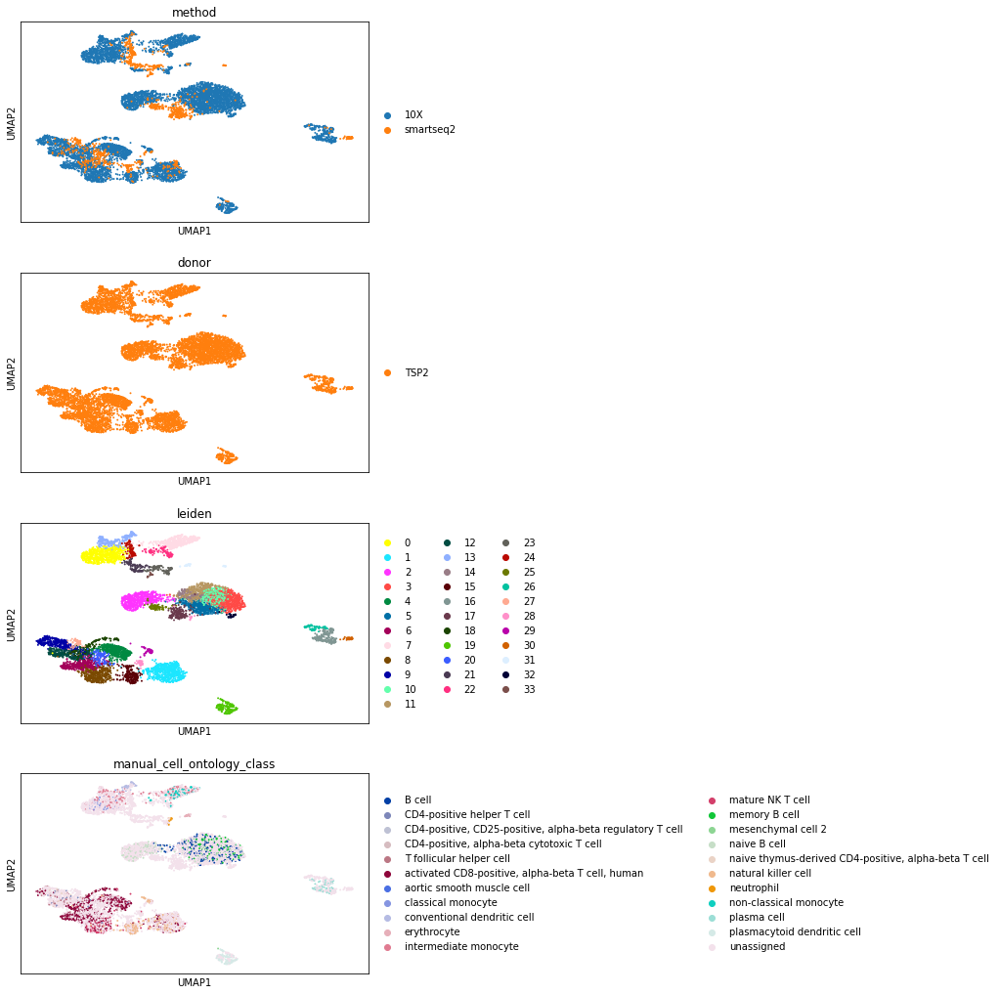

In [5]:
organ = "Spleen"
organ_adata = adata[adata.obs["tissue"] == organ]
sc.pp.neighbors(organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(organ_adata)
organ_adata.obsm["X_umap_decontX"] = organ_adata.obsm["X_umap"].copy()
sc.tl.leiden(organ_adata, resolution=2)
sc.pl.umap(
    organ_adata,
    color=["method", "donor", "leiden", "manual_cell_ontology_class"],
    ncols=1,
)
organ_adata.X = np.log1p(organ_adata.X)

# cluster to celltype correspondance
count is a matrix of cluster-cell type correspondance, where each row is a celltype, and each colum is a cluster. The entries to the matrix is the number of cells that is annotated as celltype *X* and cluster *Y*

In [6]:
count = {}
for c in np.unique(organ_adata.obs["leiden"]):
    count[c] = {}
    for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
        count[c][t] = np.sum(
            (organ_adata.obs["leiden"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )

count = pd.DataFrame.from_dict(count)

We can visualize the cluster assignment of each cell type through this heatmap. The color is normalized for each celltype 

<AxesSubplot:>

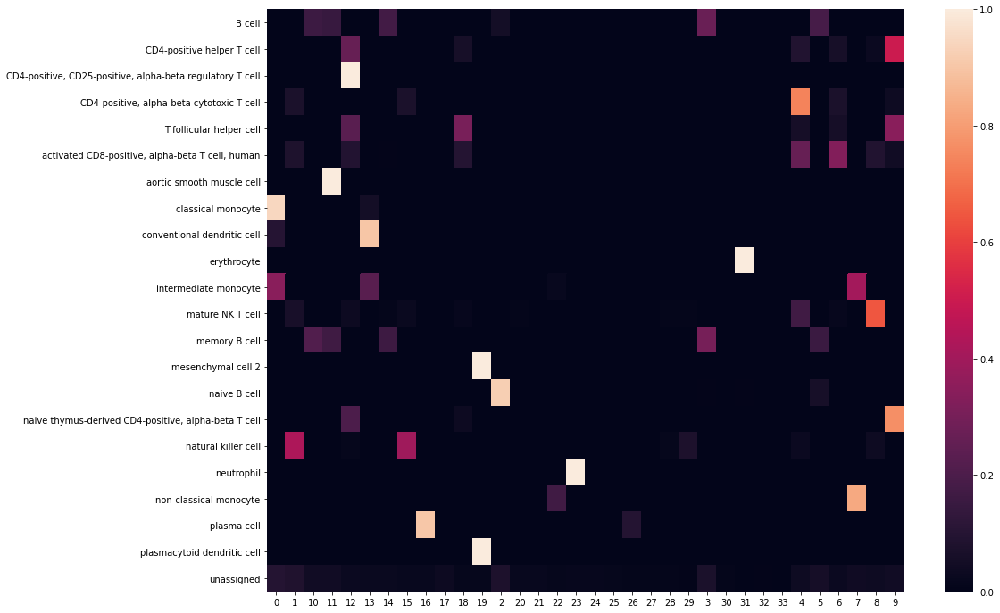

In [7]:
import seaborn

plt.figure(figsize=(16, 12))
seaborn.heatmap((count.T / count.sum(axis=1)).T)

# dictionary of cell type composition of each cluster 
What are clusters previously annotated as 

In [8]:
cluster_composition = {}
for x in count.columns.values:
    t = count.index[count[x] > 0].values
    freq = np.asarray([count.loc[y, x] for y in t]) / count[x].sum()
    res = [a + ": %.2f" % b for a, b in zip(t, freq)]
    cluster_composition[x] = res

In [9]:
cluster_composition["0"]

['classical monocyte: 0.06',
 'conventional dendritic cell: 0.01',
 'intermediate monocyte: 0.08',
 'unassigned: 0.85']

# Reassign pure clusters
If a cluster is very pure (>95% of annotated cells come from the same celltype, we reassign the clusters to all have the same labels) 

In [10]:
def Purity(x):
    names = x.index
    x = np.asarray(x).ravel()
    x = x[names != "unassigned"]
    return (np.max(x) / np.sum(x), names[np.argmax(x)])

In [11]:
cluster_purity = count.apply(Purity, axis=0).T
confident_clusters = cluster_purity[cluster_purity[0] > 0.95].index

<ipython-input-1-963029a66ab7>:5: RuntimeWarning: invalid value encountered in long_scalars
  return (np.max(x) / np.sum(x), names[np.argmax(x)])


In [12]:
for i in confident_clusters:
    organ_adata.obs.loc[
        organ_adata.obs["leiden"] == i, "new_manual_cell_ontology_class"
    ] = cluster_purity.loc[i, 1]

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'new_manual_cell_ontology_class' as categorical


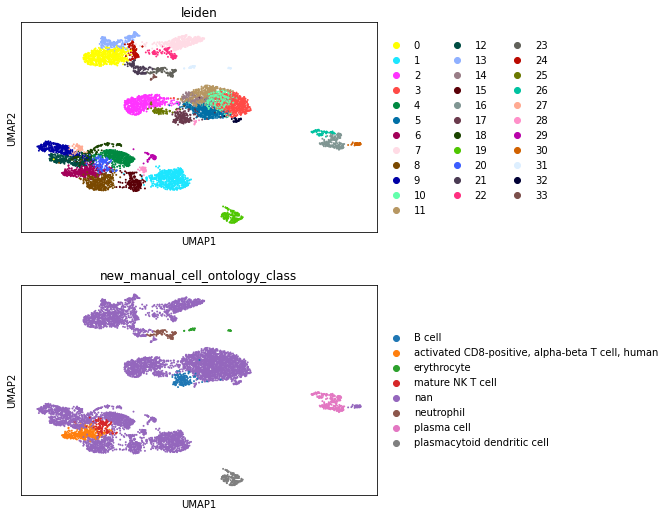

In [13]:
sc.pl.umap(
    organ_adata,
    color=["leiden", "new_manual_cell_ontology_class"],
    ncols=1,
)

In [14]:
organ_adata.obs.groupby(["leiden"]).agg(
    {"new_manual_cell_ontology_class": set, "Propagated.Annotation": set}
)

,new_manual_cell_ontology_class,Propagated.Annotation
leiden,,
0,{nan},"{classical monocyte, conventional dendritic ce..."
1,{nan},"{activated CD8-positive, alpha-beta T cell, hu..."
2,{nan},"{B cell, naive B cell, memory B cell, T follic..."
3,{nan},"{B cell, naive B cell, memory B cell}"
4,{nan},"{activated CD8-positive, alpha-beta T cell, hu..."
5,{nan},"{B cell, naive B cell, memory B cell}"
6,"{activated CD8-positive, alpha-beta T cell, hu...","{activated CD8-positive, alpha-beta T cell, hu..."
7,{nan},"{conventional dendritic cell, non-classical mo..."
8,{nan},"{activated CD8-positive, alpha-beta T cell, hu..."


/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


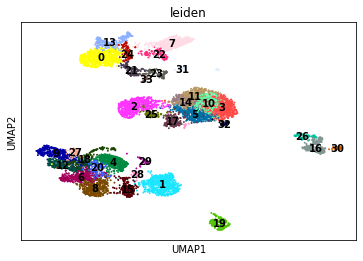

In [15]:
sc.pl.umap(organ_adata, color="leiden", legend_loc="on data")

# Sankey Diagram between cluster and compartment

In [16]:
from utils.colorDict import (
    donor_colors,
    method_colors,
    compartment_colors,
    tissue_colors,
)

In [17]:
from utils.plotting_utils import *
from utils.colorDict import compartment_colors

import plotly
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.io as pio

pio.renderers.default = "notebook"

init_notebook_mode(connected=True)

In [18]:
df = pd.DataFrame(columns=["celltype", "compartment", "count"])
for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
    for c in np.unique(organ_adata.obs["compartment_pred_svm"]):
        x = np.sum(
            (organ_adata.obs["compartment_pred_svm"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )
        df = df.append(
            pd.DataFrame([t, c, x], index=["celltype", "compartment", "count"]).T,
            ignore_index=True,
        )


fig = genSankey(
    df,
    cat_cols_color=[compartment_colors(), "#00A1E0"],
    cat_cols=["compartment", "celltype"],
    value_cols="count",
    title="celltype-compartment",
)
iplot(fig, validate=False)
plotly.offline.plot(
    fig, validate=False, filename="figures/celltype_sankey_%s" % organ + ".html"
)  # , output_type='div')

'figures/celltype_sankey_Spleen.html'

# visualize compartment markers

In [19]:
compartment_markers = {
    "Epithelial": ["CDH1", "CLDN4", "EPCAM"],
    "Endothelial": ["CA4", "CDH5", "CLDN5", "PECAM1", "VWF"],
    "Stromal": ["BGN", "DCN", "COL1A2"],
    "Immune": ["LCP1", "PTPRC", "RAC2"],
}

In [20]:
for x in compartment_markers.keys():
    sc.tl.score_genes(organ_adata, compartment_markers[x], score_name="%s_score" % x)

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



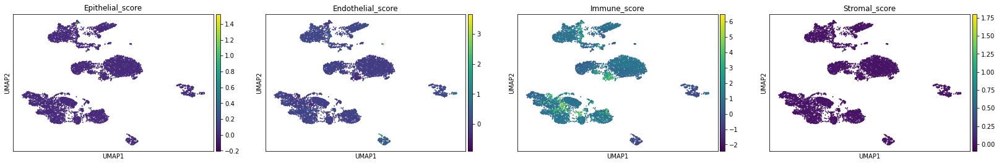

In [21]:
sc.pl.umap(
    organ_adata,
    color=["Epithelial_score", "Endothelial_score", "Immune_score", "Stromal_score"],
)

# Find markers for each cluster

In [22]:
sc.tl.rank_genes_groups(organ_adata, groupby="leiden", method="wilcoxon")

In [23]:
def FormatDE(res):
    groups = res['scores'].dtype.names
    df_res = {}
    for group in groups:
        df = pd.DataFrame([res['scores'][group],
                           res['logfoldchanges'][group],res['pvals_adj'][group]], 
                           columns=res['names'][group],
                           index=['wilcoxon_score','log fold change','adjusted pvalue'])
        df_res[group] = df
    return df_res


In [24]:
DE = FormatDE(organ_adata.uns["rank_genes_groups"])

### top positive marker genes

In [25]:
organ_cluster_genes = pd.DataFrame(organ_adata.uns['rank_genes_groups']['names'])
organ_cluster_genes.iloc[:20]


,0,1,2,3,4,5,6,7,8,9,...,24,25,26,27,28,29,30,31,32,33
0,S100A9,GNLY,IGHD,RPL28,IL7R,TNFRSF13C,GZMK,C1QC,CMC1,IL7R,...,PLAUR,CD74,IGKC,SARAF,AREG,HMGB2,PRDX4,HBA1,LINC01781,AL512646.1
1,VCAN,GZMB,IGHM,CD79A,LYAR,MS4A1,CCL5,C1QB,TRGC2,CD3E,...,LYZ,TXNIP,MZB1,RPL13A,ZFP36L2,NKG7,SSR4,TRIM58,LINC01857,LINC01517
2,S100A8,PRF1,AL139020.1,LTB,FGFBP2,BANK1,CD3D,SLC40A1,KLRD1,IL32,...,TMSB10,RPL21,DERL3,RPS27,NR4A1,KLRF1,MZB1,HBB,LTB,AC109466.1
3,LYZ,NKG7,YBX3,RPL10P9,GZMB,LTB,GZMA,C1QA,CCL5,BCL11B,...,PSAP,HLA-DRA,IGHG3,RPL13AP5,ID2,H2AFZ,HERPUD1,HBA2,RPS18,AL117329.1
4,FCN1,CD247,LINC00926,RPL39,GNLY,LINC01781,IL32,LGMN,CD3D,CD3D,...,NEAT1,IGHM,IGHG2,EEF1A1,FKBP5,STMN1,FKBP11,ALAS2,RPS12,SRD5A3-AS1
5,MNDA,KLRD1,STAG3,MS4A1,GZMA,CD79A,TRAC,LIPA,CD7,TRAC,...,TIMP1,HLA-DRB1,XBP1,RPS25,CELF2,GNLY,SPCS2,ADIPOR1,BANK1,SOX2-OT
6,THBS1,FGFBP2,CD79A,BANK1,CD3D,TXNIP,CD3G,APOE,CD3E,CD3G,...,SAT1,MS4A1,IGHG1,EEF1A1P5,IL7R,KLRD1,HSP90B1,SLC25A37,SMIM14,AL591485.1
7,S100A6,KLRF1,CD37,SNHG29,CCL5,BLK,CST7,CREG1,TRDC,LEPROTL1,...,FTL,LAPTM5,SSR4,RPL23A,FOSB,PRF1,XBP1,TMCC2,SNHG29,MYH3
8,C5AR1,CST7,BCL11A,SMIM14,CD2,CD37,CD2,MPEG1,PIK3R1,LDHB,...,FTH1P10,BTG1,PRDX4,RPS3,SMARCA2,MKI67,SSR3,GLRX5,RPL36,PLEKHA5
9,PLAUR,GZMA,TNFRSF13C,HLA-DQA1,CD3G,CD52,CD3E,SLCO2B1,IL32,SPOCK2,...,FCER1G,RPL18AP3,FKBP11,RPL13,NFKBIA,GZMA,SPCS2P4,UBB,RPS5,PCBP1-AS1


In [26]:
for x in DE.keys():
    print(x)
    display(DE[x].T[:20])

0


,wilcoxon_score,log fold change,adjusted pvalue
S100A9,39.924568,6.841537,0.000000e+00
VCAN,39.776543,6.670365,0.000000e+00
S100A8,39.740734,6.507125,0.000000e+00
LYZ,39.297451,6.777475,0.000000e+00
FCN1,39.221622,6.197366,0.000000e+00
MNDA,38.278042,4.977868,0.000000e+00
THBS1,37.553383,5.572126,1.043346e-304
S100A6,37.473263,4.617658,1.847983e-303
C5AR1,37.451225,4.993999,3.752550e-303
PLAUR,37.413609,5.030032,1.382132e-302


1


,wilcoxon_score,log fold change,adjusted pvalue
GNLY,38.574825,6.511953,0.000000e+00
GZMB,38.076939,5.463001,0.000000e+00
PRF1,37.198799,4.505153,1.400360e-298
NKG7,35.906700,4.305780,3.533968e-278
CD247,35.059761,3.797098,3.259762e-265
KLRD1,34.841553,4.205596,5.608414e-262
FGFBP2,34.074551,5.084215,1.478004e-250
KLRF1,33.322357,4.500580,1.348322e-239
CST7,32.906860,3.434039,1.146882e-233
GZMA,31.986759,3.531049,9.809417e-221


2


,wilcoxon_score,log fold change,adjusted pvalue
IGHD,36.938202,5.084693,6.632383e-294
IGHM,36.164833,4.756720,6.403124e-282
AL139020.1,33.595242,5.595334,3.863232e-243
YBX3,28.480089,2.764267,2.028257e-174
LINC00926,25.661160,2.788680,1.698685e-141
STAG3,23.156717,3.035191,3.854473e-115
CD79A,22.823742,2.325347,7.844184e-112
CD37,21.454203,1.429690,1.023361e-98
BCL11A,21.056953,1.689009,4.151830e-95
TNFRSF13C,20.318445,1.751382,1.485716e-88


3


,wilcoxon_score,log fold change,adjusted pvalue
RPL28,29.284271,1.856059,9.684069e-184
CD79A,28.763754,3.110477,1.794347e-177
LTB,28.648499,3.042668,3.284140e-176
RPL10P9,28.544548,1.870782,4.831231e-175
RPL39,28.302832,1.814414,3.755194e-172
MS4A1,27.815046,2.934890,2.799323e-166
BANK1,27.594818,2.653842,1.079848e-163
SNHG29,27.573938,1.975518,1.681991e-163
SMIM14,27.460026,2.465953,3.172153e-162
HLA-DQA1,27.459244,2.867800,3.172153e-162


4


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,26.330479,4.004123,5.056607e-148
LYAR,26.061800,2.566307,2.910580e-145
FGFBP2,24.934799,3.216774,6.125994e-133
GZMB,24.573006,2.779952,2.891336e-129
GNLY,23.700724,3.422492,3.477570e-120
GZMA,23.311440,2.649916,2.220085e-116
CD3D,22.620516,2.249165,1.335737e-109
CCL5,22.489172,2.719939,2.399139e-108
CD2,21.220205,2.080655,2.032721e-96
CD3G,21.161175,1.914465,6.408982e-96


5


,wilcoxon_score,log fold change,adjusted pvalue
TNFRSF13C,21.112095,2.262532,1.812669e-94
MS4A1,20.525408,2.332475,2.505632e-89
BANK1,20.075075,2.015073,1.794016e-85
LTB,19.032818,2.030552,1.073945e-76
LINC01781,18.707745,2.170156,4.200565e-74
CD79A,18.192417,2.142168,4.984500e-70
TXNIP,17.373941,1.492354,9.565244e-64
BLK,17.088108,1.878094,1.071328e-61
CD37,16.777107,1.297857,1.920752e-59
CD52,16.735218,1.483336,3.371074e-59


6


,wilcoxon_score,log fold change,adjusted pvalue
GZMK,26.514147,4.475831,3.919447e-150
CCL5,25.930866,3.974669,8.798473e-144
CD3D,24.504356,3.088346,2.604736e-128
GZMA,24.214996,3.212327,2.276027e-125
IL32,23.827387,2.993988,2.046021e-121
TRAC,22.118732,2.868533,2.047797e-104
CD3G,21.976807,2.580804,4.037370e-103
CST7,21.700180,2.580970,1.503815e-100
CD2,21.613842,2.824926,8.478393e-100
CD3E,21.610201,2.556434,8.478393e-100


7


,wilcoxon_score,log fold change,adjusted pvalue
C1QC,32.227764,8.595209,4.244599e-223
C1QB,32.189518,9.133520,7.282199e-223
SLC40A1,32.092190,7.519205,1.111943e-221
C1QA,32.000328,8.471426,1.588035e-220
LGMN,31.671978,6.498230,4.449133e-216
LIPA,31.644274,6.681384,8.920570e-216
APOE,31.587839,8.663146,4.561292e-215
CREG1,31.511986,5.663514,4.380054e-214
MPEG1,31.449760,5.853124,2.766439e-213
SLCO2B1,31.443682,8.722296,3.014860e-213


8


,wilcoxon_score,log fold change,adjusted pvalue
CMC1,25.580908,3.551690,1.464982e-139
TRGC2,24.666981,3.842221,7.121533e-130
KLRD1,24.096098,3.429385,5.389715e-124
CCL5,23.414827,3.607314,4.442403e-117
CD3D,22.954601,2.827415,1.560663e-112
CD7,22.674509,2.914157,7.846368e-110
CD3E,22.539680,2.769208,1.425782e-108
TRDC,21.844761,3.924752,5.737681e-102
PIK3R1,21.844481,2.353245,5.737681e-102
IL32,20.244644,2.370540,2.331448e-87


9


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,25.326334,4.371461,9.645175e-137
CD3E,21.031778,2.667859,9.884875e-94
IL32,19.712450,2.338580,2.481380e-82
BCL11B,19.315914,2.751760,4.646954e-79
CD3D,18.884827,2.115155,1.491730e-75
TRAC,18.865900,2.202343,1.829506e-75
CD3G,18.175722,1.969249,5.913758e-70
LEPROTL1,18.039854,1.747018,5.580488e-69
LDHB,17.714458,1.491376,1.591116e-66
SPOCK2,17.701126,2.219353,1.861254e-66


10


,wilcoxon_score,log fold change,adjusted pvalue
MS4A1,23.479769,3.228598,3.865366e-117
BANK1,23.448912,2.935216,3.991749e-117
TNFRSF13C,22.946564,2.869451,3.129178e-112
RPL28,22.876085,1.826982,1.183285e-111
HLA-DQA1,22.664534,2.987323,1.181000e-109
RPL39,22.574354,1.820729,7.597404e-109
RPL22L1,22.373991,2.273008,5.931906e-107
CD22,21.831476,2.587777,8.579869e-102
SMIM14,21.447021,2.389601,3.184482e-98
SNHG29,21.295992,1.923689,7.279845e-97


11


,wilcoxon_score,log fold change,adjusted pvalue
BANK1,24.027742,3.237999,8.399254e-123
TNFRSF13C,23.591547,3.121578,1.385345e-118
MS4A1,22.772717,3.315803,1.677409e-110
RALGPS2,22.510248,2.854563,4.848336e-108
AC027290.2,21.900003,2.552656,3.058413e-102
TNFRSF13B,21.544527,3.218331,5.846783e-99
CD22,21.030718,2.561126,2.888175e-94
CD79A,20.728809,2.879033,1.401447e-91
LY9,20.195818,2.162963,6.969470e-87
CD83,20.017891,2.332840,2.264497e-85


12


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,23.640530,5.049615,8.696097e-119
CD3E,17.369688,2.514080,2.746977e-63
CD3D,16.978701,2.271359,1.737717e-60
IL32,16.699142,2.299334,1.565485e-58
TRAC,16.604925,2.442190,6.299012e-58
BCL11B,15.919040,2.536773,3.931637e-53
ZFP36L2,15.792296,1.788720,2.586941e-52
KLRB1,15.358812,2.863053,2.022428e-49
CD3G,14.951087,1.930625,8.200495e-47
LEPROTL1,14.234437,1.561492,2.355314e-42


13


,wilcoxon_score,log fold change,adjusted pvalue
CST3,22.785299,5.623576,3.776022e-110
LYZ,22.580553,5.821320,1.981053e-108
AIF1,22.523222,5.030219,4.823899e-108
LST1,22.506226,4.751393,5.308589e-108
FGL2,22.286131,4.510735,5.930390e-106
SPI1,22.246674,3.837914,1.191883e-105
COTL1,22.163296,3.678330,6.530593e-105
C1orf162,21.921572,3.675358,1.190448e-102
CLEC7A,21.680264,4.235979,2.060909e-100
CEBPD,21.602222,4.063626,1.007724e-99


14


,wilcoxon_score,log fold change,adjusted pvalue
MS4A1,19.387173,3.385836,5.829996e-79
CD79A,19.213285,3.222648,8.434564e-78
BANK1,17.602058,2.627502,4.661101e-65
CD52,17.182098,2.169613,5.321708e-62
HLA-DQA1,16.916763,2.695539,3.985808e-60
FCRL5,16.749992,3.031498,5.556648e-59
TNFRSF13C,16.262102,2.291634,1.541880e-55
HLA-DQB1,16.161419,2.303483,6.943977e-55
CD22,15.928881,2.168411,2.612792e-53
HLA-DPA1,15.881923,2.349207,4.977221e-53


15


,wilcoxon_score,log fold change,adjusted pvalue
KLRD1,21.424643,4.849983,4.635300e-97
KLRB1,21.157761,5.030860,6.890023e-95
CMC1,21.020702,4.797717,8.322378e-94
IL2RB,20.218384,5.111630,9.927945e-87
CD7,20.031475,3.635882,3.448037e-85
KLRC1,19.340006,5.767777,2.427879e-79
TXK,19.292950,4.906927,5.177079e-79
KLRF1,19.041901,5.212200,5.643690e-77
FYN,18.542250,3.397320,6.161668e-73
SYTL3,18.506462,3.522529,1.078148e-72


16


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,23.735456,9.513018,9.141659e-120
DERL3,23.656446,8.049164,2.982089e-119
PRDX4,23.426805,6.689714,4.472000e-117
IGKC,23.377886,13.033722,1.056005e-116
SSR3,23.171854,4.802081,1.030838e-114
SEC11C,23.048328,5.551712,1.420763e-113
CLPTM1L,23.044003,4.504046,1.420763e-113
XBP1,22.944757,6.028823,1.223187e-112
SSR4,22.902864,5.728359,2.845832e-112
ERLEC1,22.799200,4.756972,2.499150e-111


17


,wilcoxon_score,log fold change,adjusted pvalue
CD74,22.838589,9.992604,1.117069e-110
MS4A1,22.792025,9.646623,1.619317e-110
HLA-DRA,22.648718,7.374696,2.818441e-109
HLA-DRB1,22.484541,8.340895,8.205308e-108
RPS18,22.477001,5.567589,8.205308e-108
RPL13AP5,22.383402,7.513647,5.604170e-107
CD52,22.352966,7.648793,9.501756e-107
RPL23,22.308893,5.495256,2.228969e-106
RPL13A,22.253736,6.398472,6.618866e-106
RPL18A,22.250143,5.100917,6.618866e-106


18


,wilcoxon_score,log fold change,adjusted pvalue
IL32,19.184959,4.765347,2.910107e-77
CD3D,18.801477,4.454111,2.161740e-74
CD3E,17.959806,3.867443,7.892703e-68
TRAC,17.824648,4.228916,6.695561e-67
LCK,16.744188,3.478024,7.351148e-59
CD2,16.610386,3.647115,5.751027e-58
CD3G,16.452404,3.771928,6.778726e-57
BCL11B,15.544570,3.224544,1.274395e-50
S100A4,14.923448,3.361579,1.517358e-46
SYNE2,14.421831,2.838774,2.220571e-43


19


,wilcoxon_score,log fold change,adjusted pvalue
PCDH17,20.868725,15.020015,3.972741e-92
ITGA1,20.842611,10.244996,3.972741e-92
IFI27,20.836414,10.011079,3.972741e-92
HYAL2,20.782139,8.218410,9.242150e-92
TIMP3,20.707844,10.944137,3.017816e-91
CAV1,20.705725,8.470510,3.017816e-91
NTN4,20.442102,11.487188,5.939958e-89
LIMCH1,20.430988,9.958970,6.526439e-89
CD36,20.398178,6.638121,1.135304e-88
ARHGAP29,20.384052,8.767797,1.363775e-88


20


,wilcoxon_score,log fold change,adjusted pvalue
CCL5,17.633375,7.897801,8.039664e-65
HLA-E,17.477747,5.731699,6.231338e-64
B2M,17.281641,5.785150,9.596013e-63
IL32,17.281179,7.772274,9.596013e-63
DDX5,17.012272,6.596380,7.842062e-61
MT-CO1,16.978401,5.855285,1.164393e-60
RPS27,16.831512,4.927254,1.142364e-59
MALAT1,16.826813,4.850633,1.142364e-59
MT-CYB,16.792158,5.439778,1.821872e-59
MTCO3P12,16.779402,5.508183,2.032738e-59


21


,wilcoxon_score,log fold change,adjusted pvalue
SLC11A1,13.067383,5.401577,1.017557e-35
PLAUR,12.943006,4.327162,4.046880e-35
S100A9,12.826146,4.602644,1.722570e-34
THBS1,12.220849,4.538596,2.574859e-31
S100A8,11.731675,4.279982,6.074389e-29
VCAN,11.673675,3.882370,1.175728e-28
C5AR1,11.086273,3.196525,6.943533e-26
LYZ,11.023962,3.717398,1.336562e-25
TIMP1,11.006781,3.970960,1.605082e-25
ACSL1,10.594607,3.751421,1.191225e-23


22


,wilcoxon_score,log fold change,adjusted pvalue
MS4A7,14.536457,4.314947,1.047633e-43
HMOX1,13.900308,4.421179,4.641152e-40
C1QA,13.847650,5.370668,7.738067e-40
C1QB,13.774958,5.885891,1.929837e-39
AIF1,13.296761,4.143250,1.016411e-36
C1QC,12.685813,4.829403,1.986843e-33
CST3,12.490791,3.722027,1.701456e-32
BLVRB,12.483688,3.247802,1.798306e-32
LST1,12.377373,3.114882,6.181365e-32
FCER1G,11.960107,3.080261,7.200652e-30


23


,wilcoxon_score,log fold change,adjusted pvalue
S100A8,15.094151,5.903740,1.108198e-48
S100A9,14.847117,5.566780,4.233115e-47
CSF3R,14.611977,5.070796,1.308374e-45
IL1R2,14.529045,5.597132,4.323592e-45
IFITM2,13.182004,3.251364,4.401090e-37
S100A12,11.979058,4.966926,1.471729e-30
G0S2,11.674038,4.234468,5.277293e-29
GCA,11.047791,3.133188,5.878519e-26
FPR1,11.019817,3.318038,7.918514e-26
NAMPT,10.691291,3.011777,2.561056e-24


24


,wilcoxon_score,log fold change,adjusted pvalue
PLAUR,15.967717,9.429651,1.262718e-52
LYZ,15.833848,8.968606,5.350007e-52
TMSB10,15.727209,6.021717,1.548837e-51
PSAP,15.722990,7.961920,1.548837e-51
NEAT1,15.630854,5.503912,5.283555e-51
TIMP1,15.600626,8.927095,7.072592e-51
SAT1,15.582573,8.185950,8.042263e-51
FTL,15.485803,6.995949,3.183632e-50
FTH1P10,15.475127,5.104258,3.252018e-50
FCER1G,15.470078,7.912181,3.252018e-50


25


,wilcoxon_score,log fold change,adjusted pvalue
CD74,14.225719,8.425347,3.735212e-41
TXNIP,14.176424,6.306304,3.774050e-41
RPL21,13.864615,4.826911,1.727741e-39
HLA-DRA,13.855768,5.939321,1.727741e-39
IGHM,13.814635,8.504404,2.449036e-39
HLA-DRB1,13.794033,6.521963,2.716276e-39
MS4A1,13.762407,7.437185,3.607905e-39
LAPTM5,13.576221,6.862729,4.077622e-38
BTG1,13.493810,3.504980,1.112513e-37
RPL18AP3,13.436595,5.038877,2.172477e-37


26


,wilcoxon_score,log fold change,adjusted pvalue
IGKC,12.834757,9.808925,2.055175e-33
MZB1,12.658467,6.026637,8.447130e-33
DERL3,11.600945,4.661386,4.284415e-28
IGHG3,11.414172,7.617223,3.267950e-27
IGHG2,11.284663,7.408287,1.210235e-26
XBP1,10.999452,3.374294,2.309520e-25
IGHG1,10.998233,8.766569,2.317302e-25
SSR4,10.975668,2.882697,2.945530e-25
PRDX4,10.365940,3.601488,1.555800e-22
FKBP11,9.756484,3.114057,6.028129e-20


27


,wilcoxon_score,log fold change,adjusted pvalue
SARAF,12.695781,8.687037,3.673745e-32
RPL13A,12.526529,6.633190,7.181468e-32
RPS27,12.504528,6.008296,7.181468e-32
RPL13AP5,12.501723,7.257082,7.181468e-32
EEF1A1,12.498311,5.852726,7.181468e-32
RPS25,12.485937,5.438312,7.181468e-32
EEF1A1P5,12.482757,7.185767,7.181468e-32
RPL23A,12.478681,5.980075,7.181468e-32
RPS3,12.466681,5.953036,7.421078e-32
RPL13,12.452717,4.724797,7.904036e-32


28


,wilcoxon_score,log fold change,adjusted pvalue
AREG,10.967638,5.845952,3.219137e-23
ZFP36L2,9.325004,3.105116,3.266696e-16
NR4A1,8.722536,4.208074,5.338326e-14
ID2,8.142610,4.312158,5.693446e-12
FKBP5,7.841287,2.873238,5.250660e-11
CELF2,7.770069,2.748176,7.696604e-11
IL7R,7.546735,4.563578,3.753433e-10
FOSB,7.454996,3.050470,6.613371e-10
SMARCA2,7.045094,3.367053,1.212304e-08
NFKBIA,6.987746,3.716090,1.644460e-08


29


,wilcoxon_score,log fold change,adjusted pvalue
HMGB2,11.689220,5.382471,8.519012e-27
NKG7,11.368300,5.189752,1.302028e-25
KLRF1,11.359728,5.376925,1.302028e-25
H2AFZ,11.266233,3.792884,2.835102e-25
STMN1,11.110540,6.570238,1.312602e-24
GNLY,10.860603,6.467122,1.742284e-23
KLRD1,10.828529,4.577837,2.120779e-23
PRF1,10.785154,4.792918,2.977084e-23
MKI67,10.717889,7.534914,5.205101e-23
GZMA,10.713033,4.431897,5.205101e-23


30


,wilcoxon_score,log fold change,adjusted pvalue
PRDX4,11.823358,12.608673,2.757298e-28
SSR4,11.822181,10.118593,2.757298e-28
MZB1,11.817248,14.790162,2.757298e-28
HERPUD1,11.805571,10.981191,2.757298e-28
FKBP11,11.800385,11.255382,2.757298e-28
SPCS2,11.799111,9.485956,2.757298e-28
HSP90B1,11.794847,10.616449,2.757298e-28
XBP1,11.791188,12.155354,2.757298e-28
SSR3,11.778779,9.715505,2.757298e-28
SPCS2P4,11.777442,8.669971,2.757298e-28


31


,wilcoxon_score,log fold change,adjusted pvalue
HBA1,9.026514,13.380527,1.272359e-16
TRIM58,8.742579,9.103725,1.315045e-15
HBB,8.519953,16.868511,8.100630e-15
HBA2,8.499561,13.465050,9.414688e-15
ALAS2,8.259068,12.968678,6.648472e-14
ADIPOR1,7.701156,4.002544,4.725034e-12
SLC25A37,7.314186,4.864688,7.364360e-11
TMCC2,7.173597,10.348029,1.911372e-10
GLRX5,7.155696,4.468376,2.149520e-10
UBB,7.037148,3.857975,4.812975e-10


32


,wilcoxon_score,log fold change,adjusted pvalue
LINC01781,4.895940,2.135527,0.000565
LINC01857,4.478791,2.436320,0.003112
LTB,3.922102,1.489454,0.023070
RPS18,3.731746,1.136509,0.042891
RPS12,3.669901,1.115841,0.052324
BANK1,3.643737,1.100333,0.056698
SMIM14,3.641096,1.172687,0.057079
SNHG29,3.559335,0.979436,0.071866
RPL36,3.370865,0.975563,0.120527
RPS5,3.197028,1.032809,0.197817


33


,wilcoxon_score,log fold change,adjusted pvalue
AL512646.1,6.258671,5.853946,2.136217e-07
LINC01517,2.162751,29.944990,1.000000e+00
AC109466.1,2.158833,10.135678,1.000000e+00
AL117329.1,2.156873,9.747714,1.000000e+00
SRD5A3-AS1,2.152464,8.436296,1.000000e+00
SOX2-OT,2.143266,7.890903,1.000000e+00
AL591485.1,2.120351,6.485353,1.000000e+00
MYH3,2.118228,6.541533,1.000000e+00
PLEKHA5,2.046817,5.037251,1.000000e+00
PCBP1-AS1,2.000824,3.241927,1.000000e+00


### for cluster 0 plot the top marker genes

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



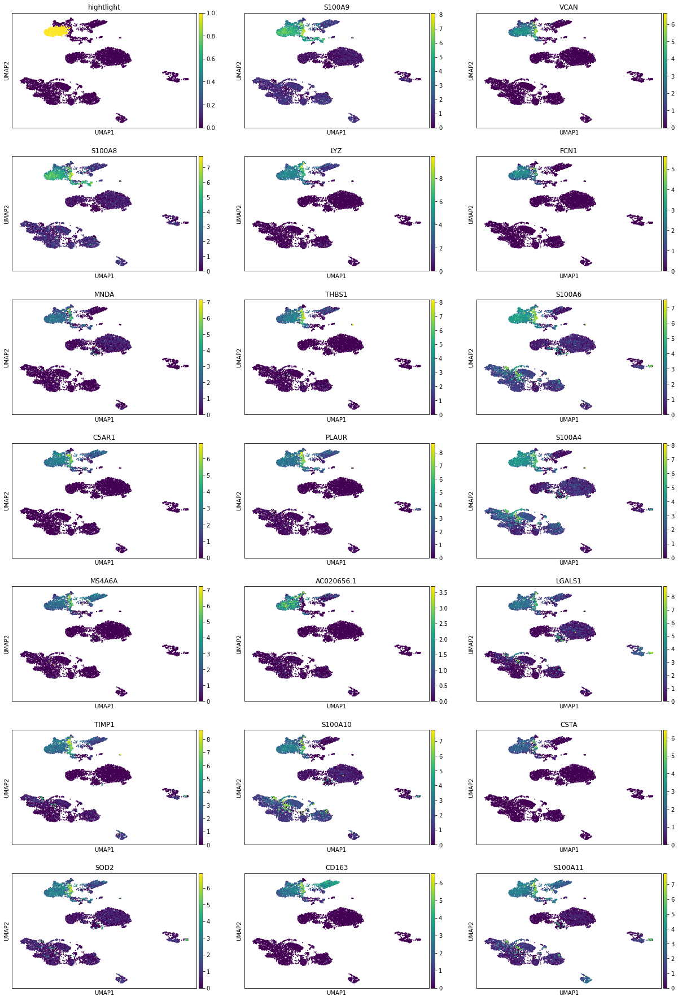

In [27]:
topgenes = list(DE["0"].T[:20].index)
organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == "0"
sc.pl.umap(
    organ_adata,
    color=["hightlight"] + topgenes,
    ncols=3,
)

You can do this for other clusters as well. Here I plot the top 5 genes for all other clusters

0


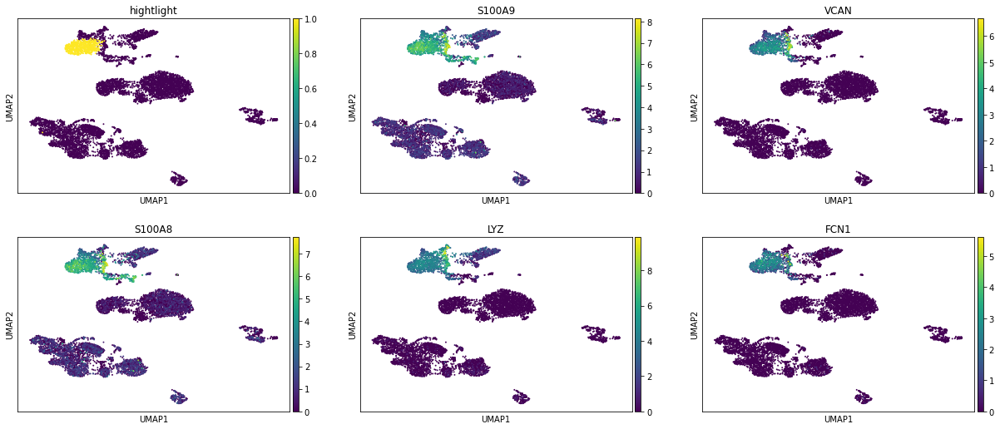

1


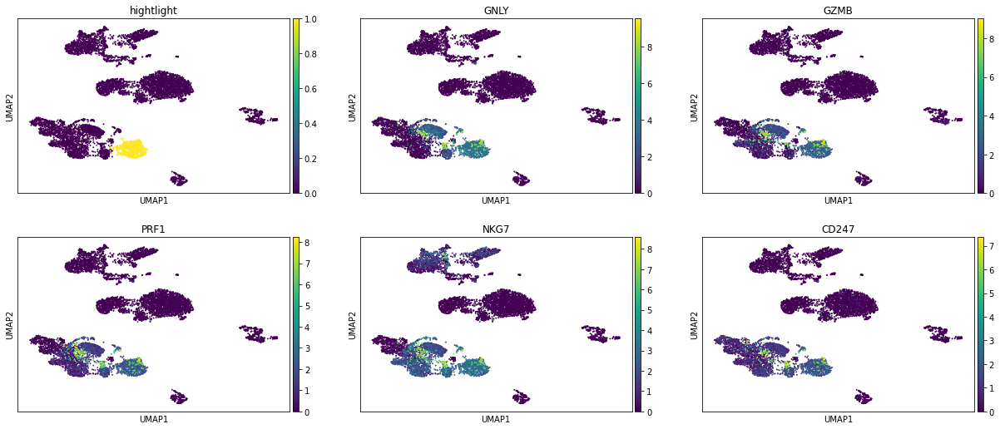

2


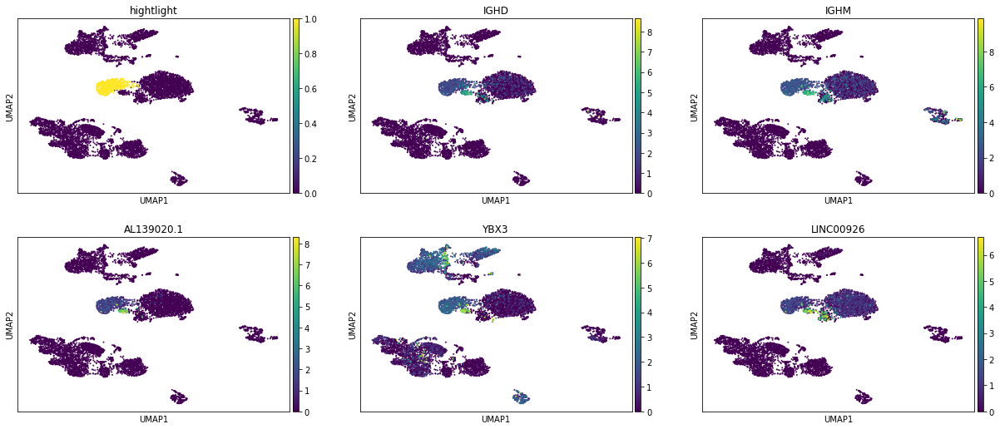

3


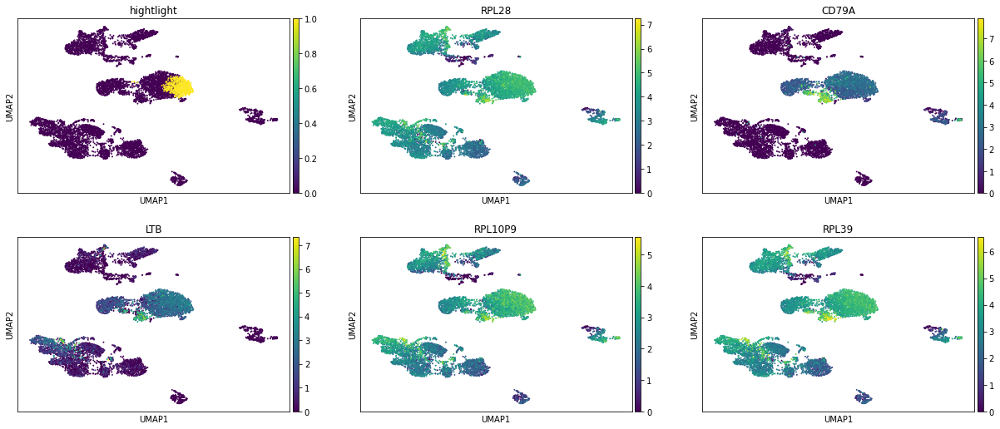

4


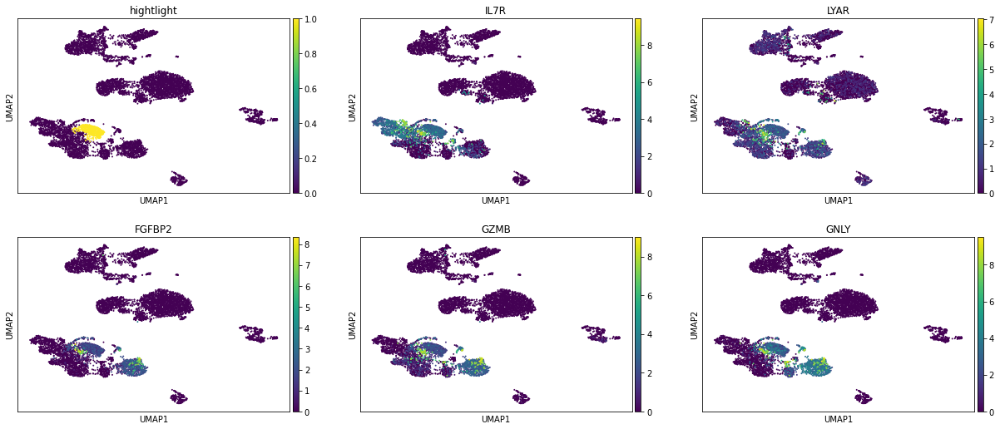

5


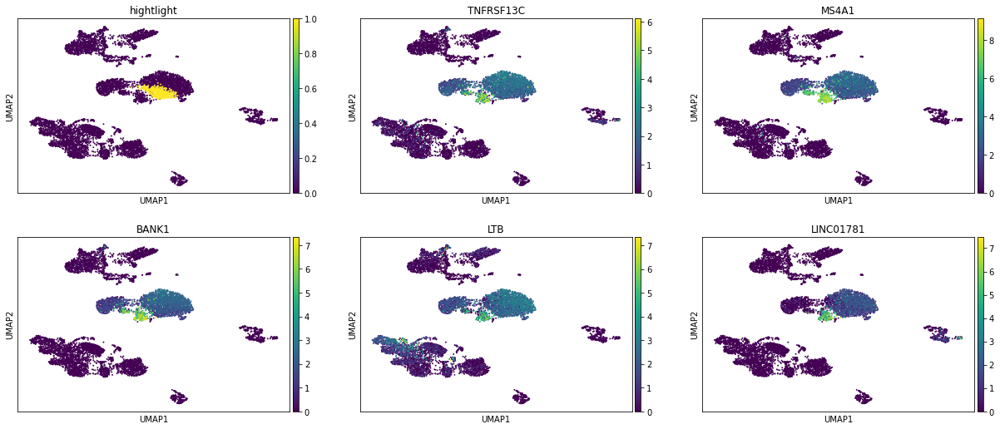

6


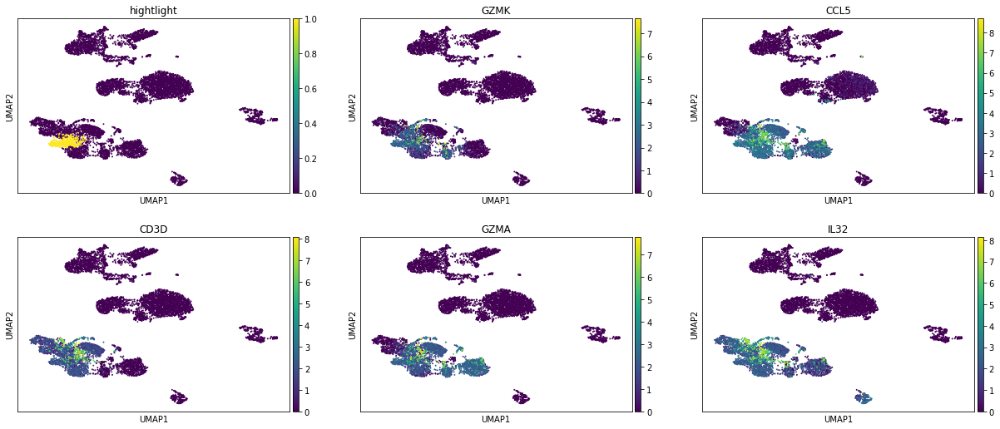

7


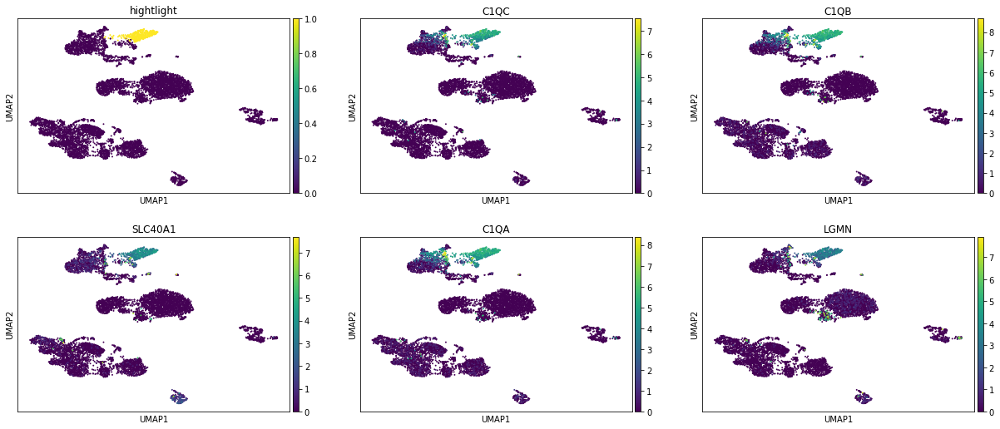

8


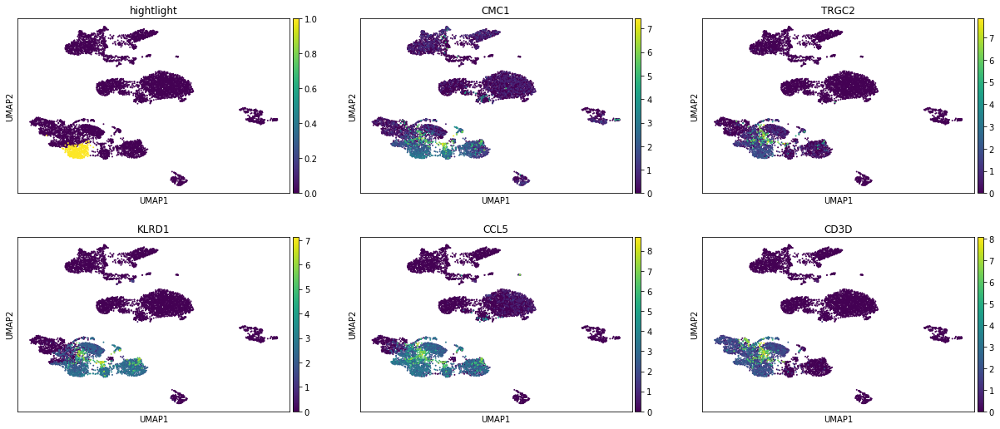

9


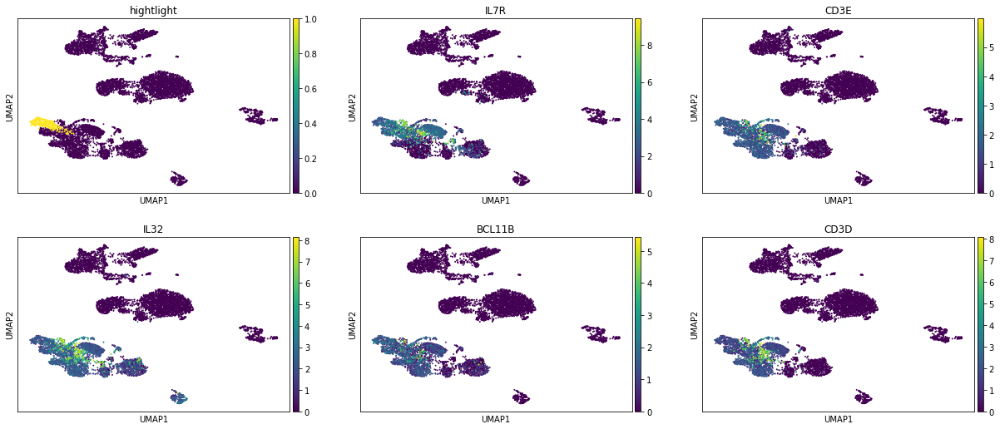

10


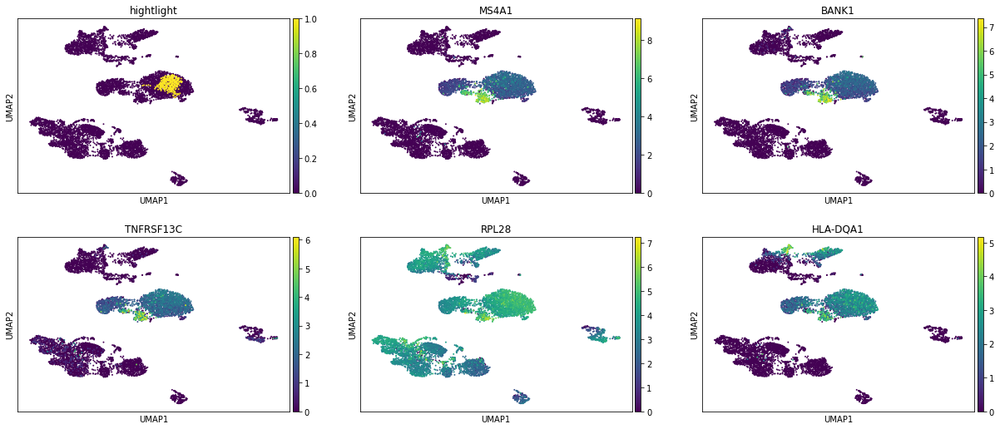

11


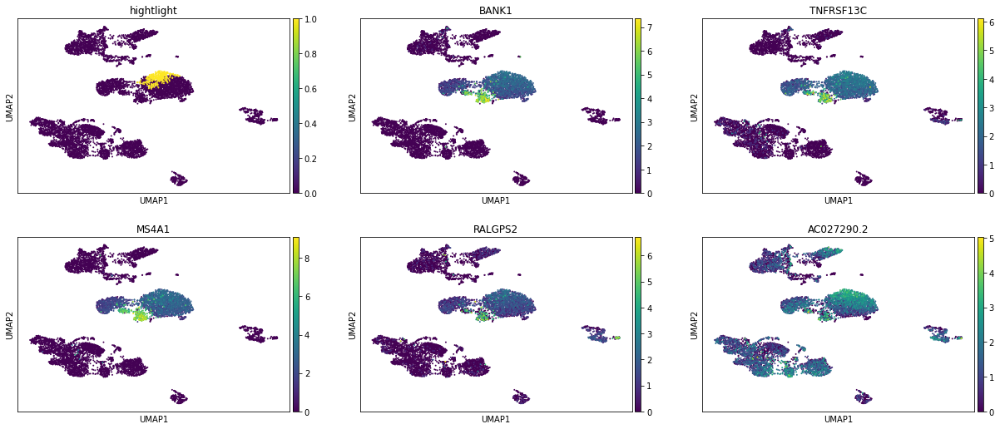

12


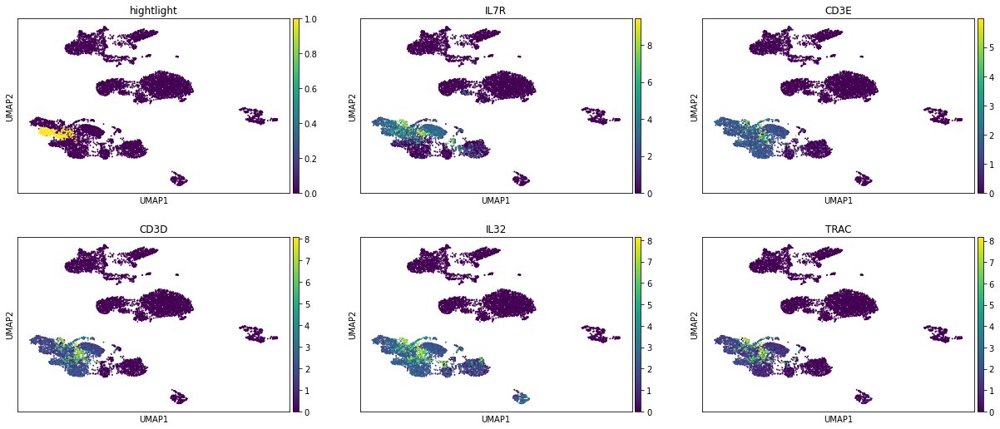

13


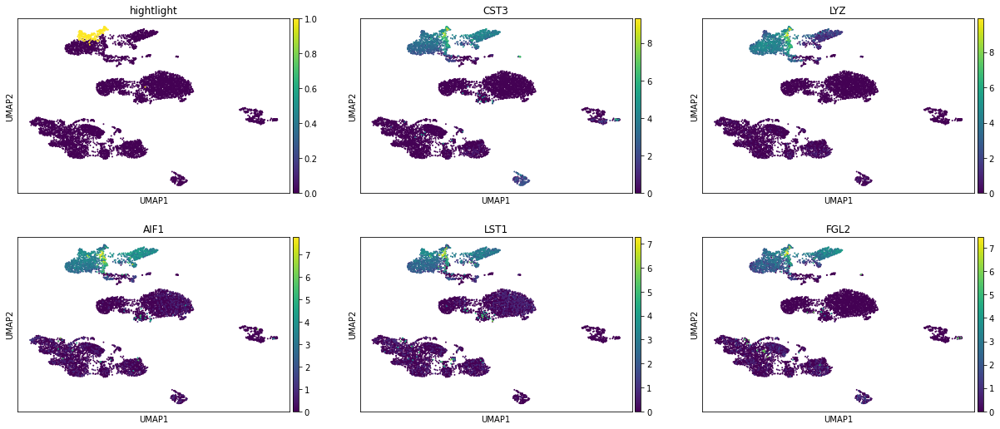

14


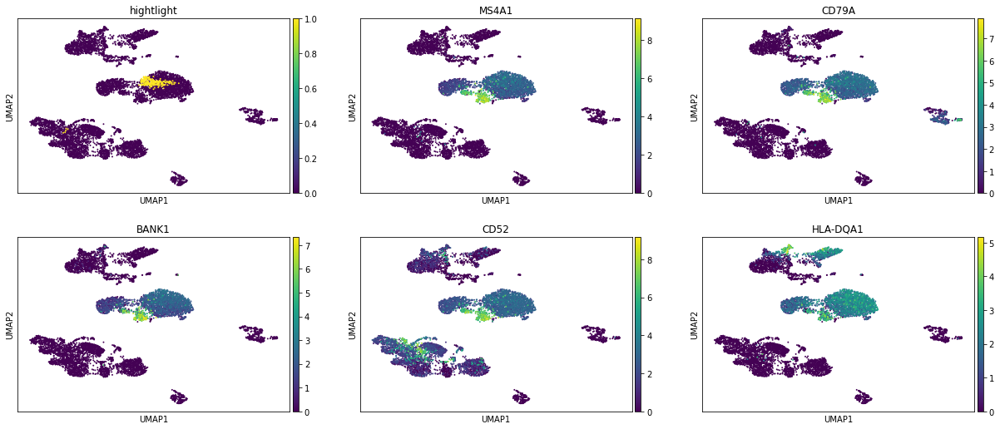

15


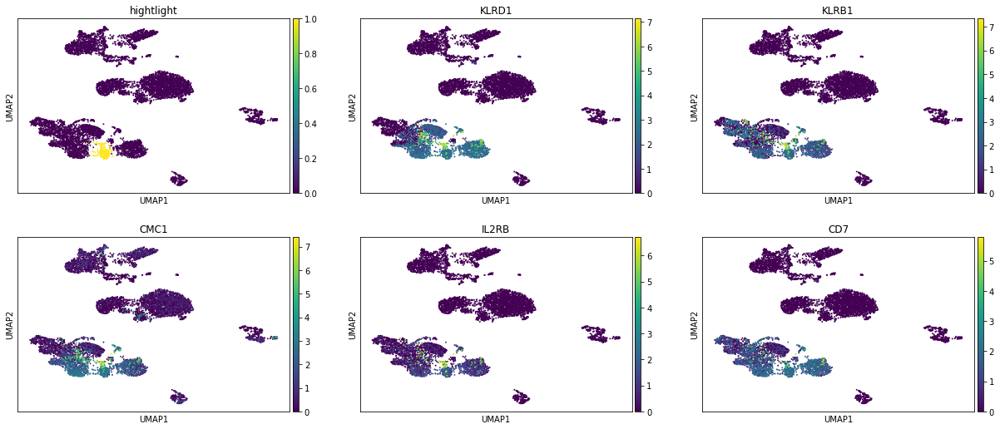

16


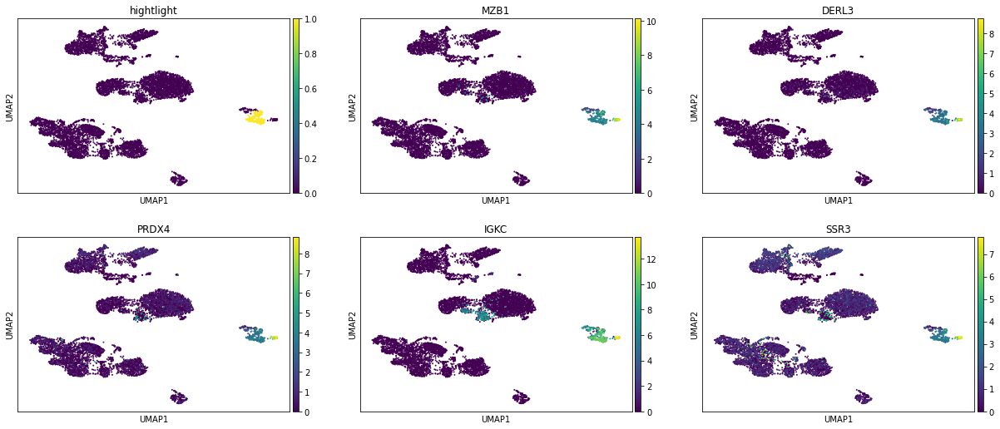

17


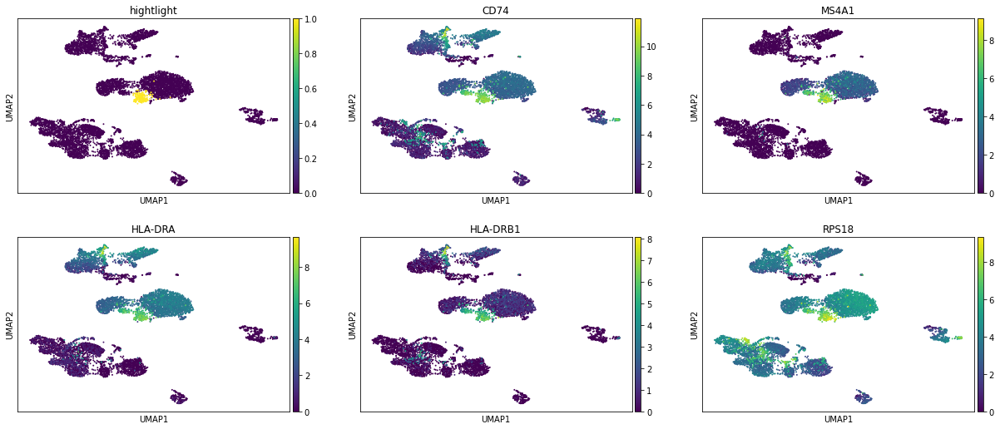

18


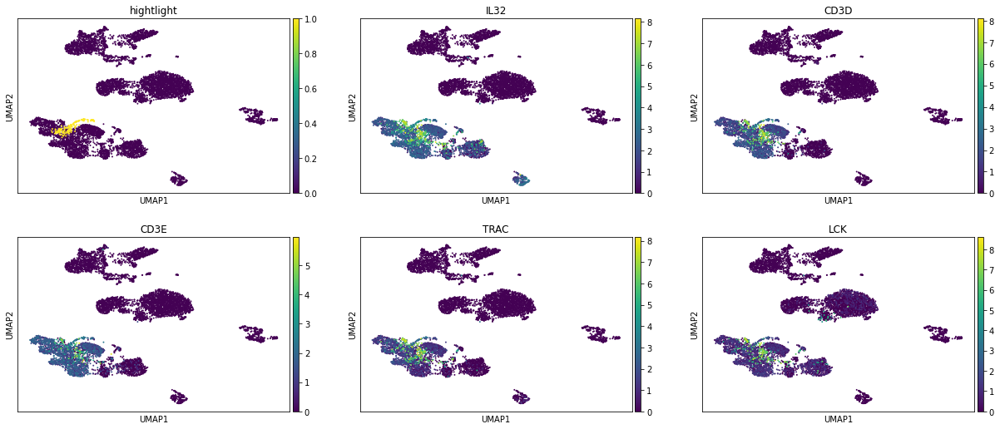

19


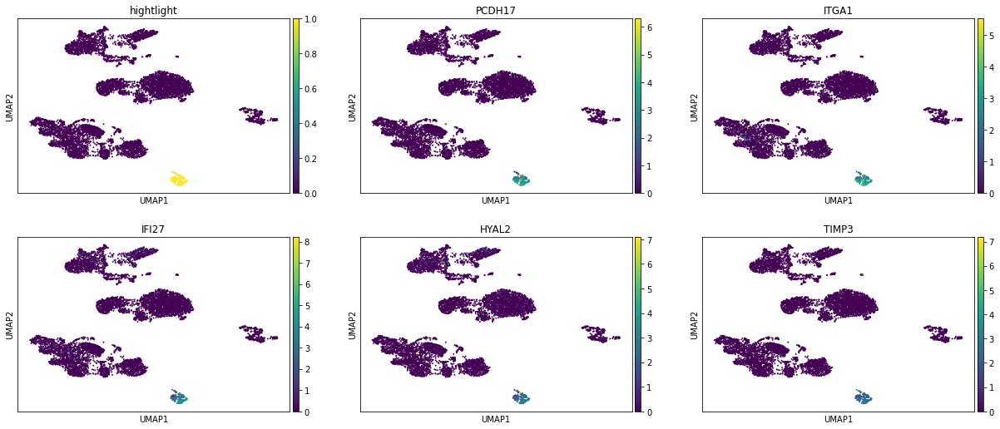

20


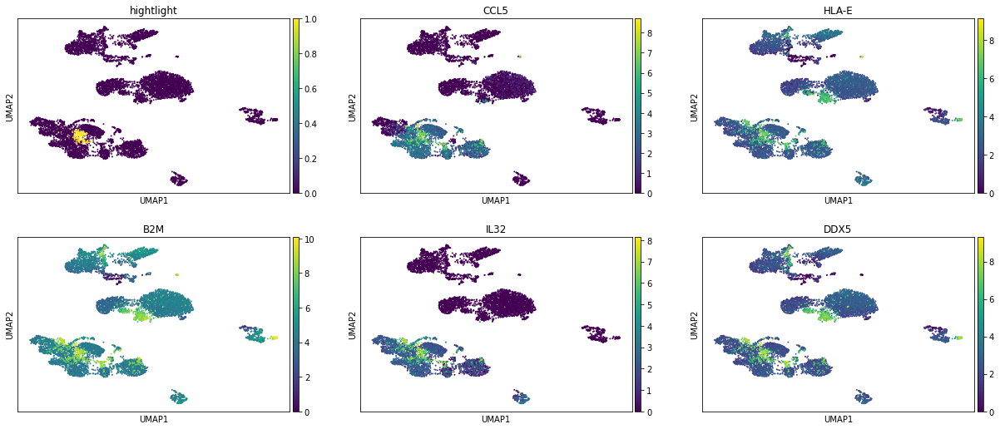

21


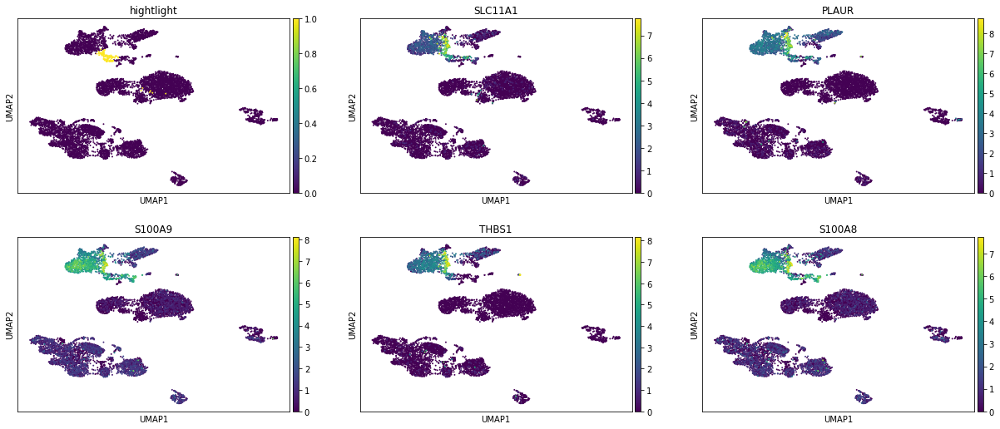

22


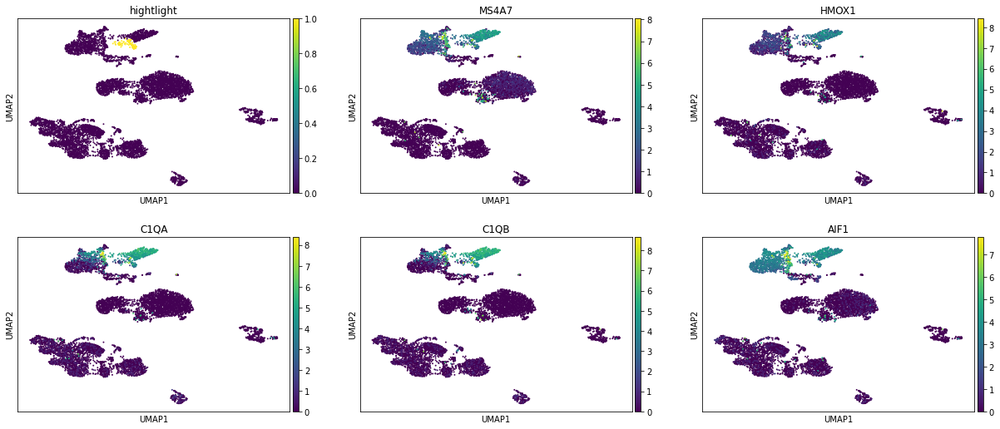

23


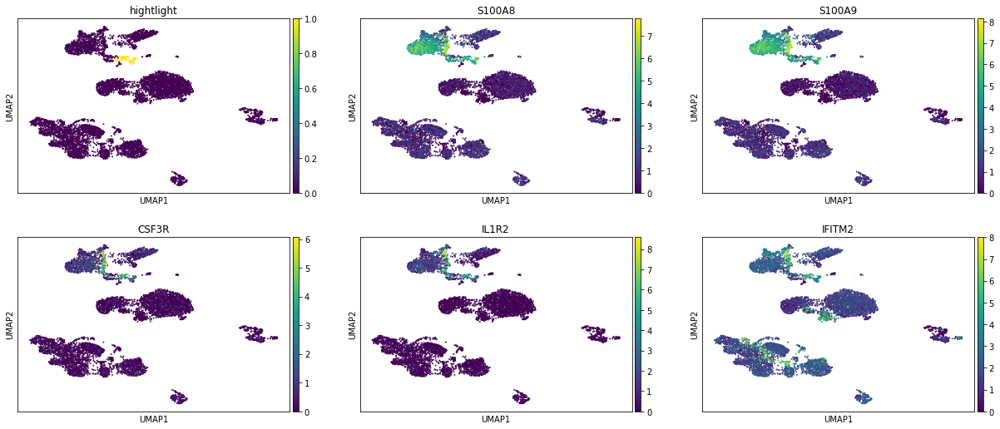

24


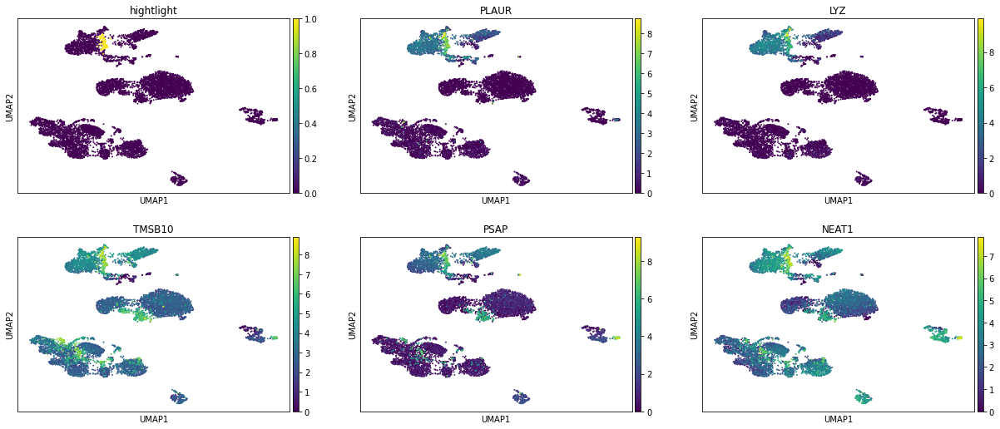

25


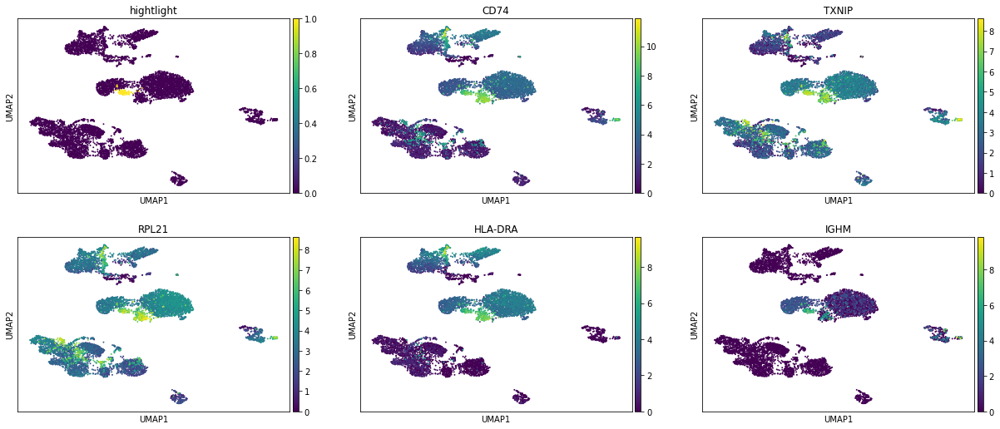

26


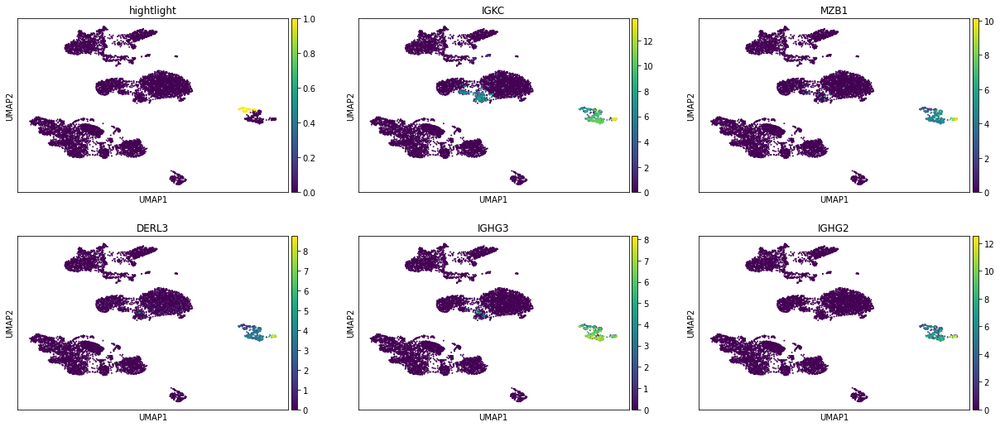

27


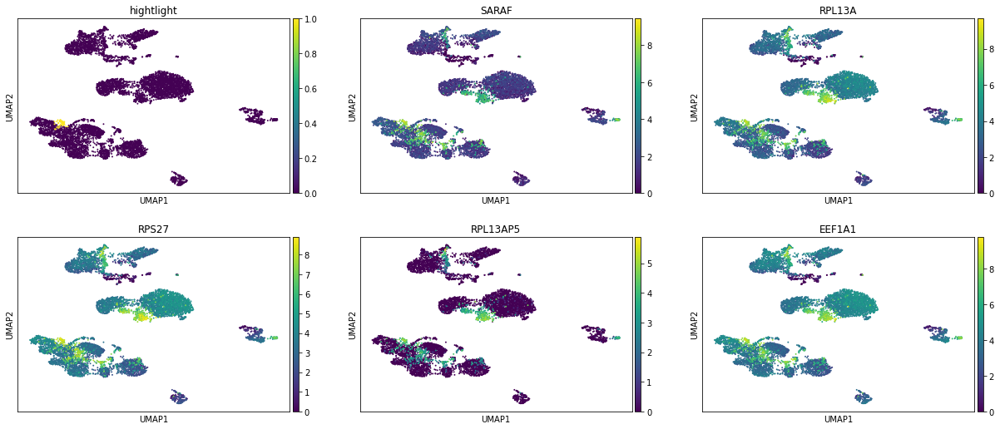

28


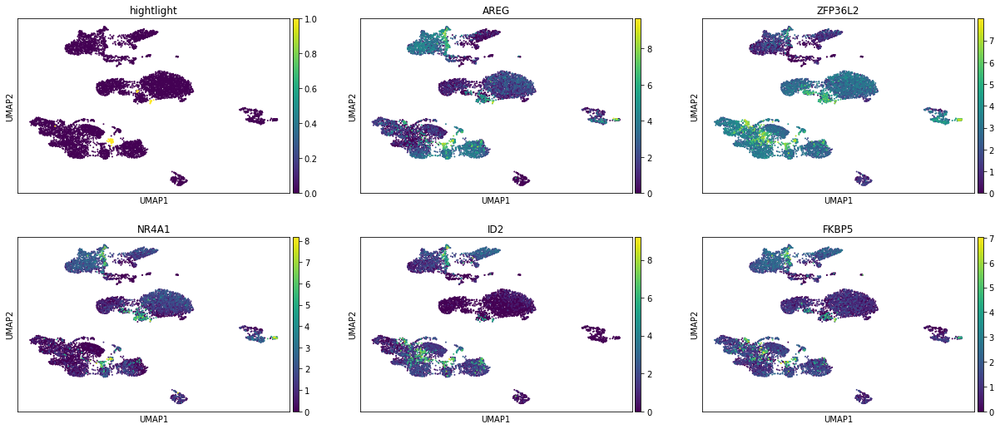

29


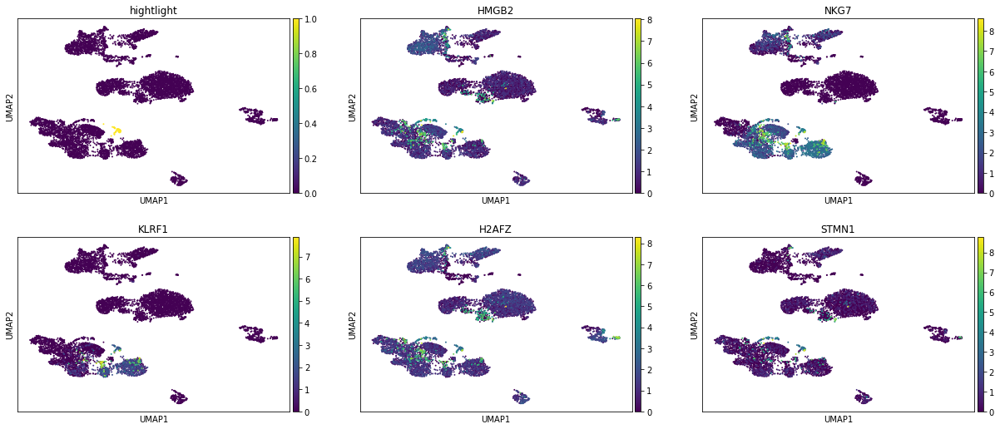

30


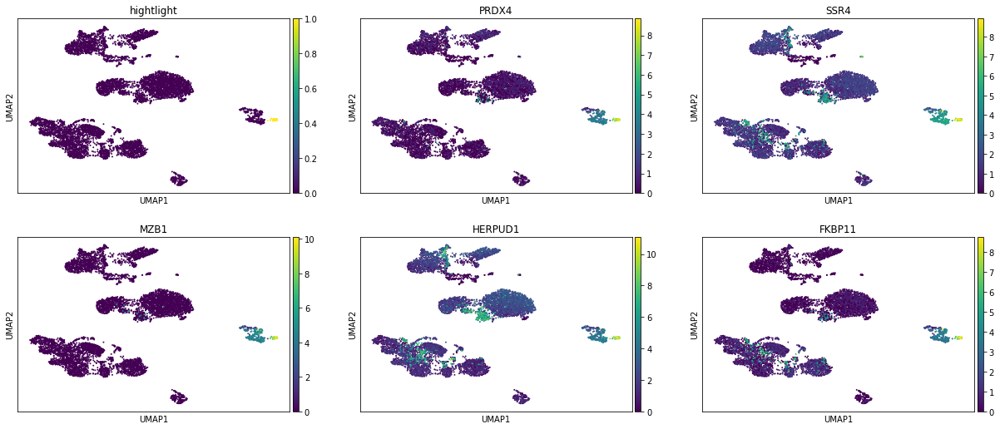

31


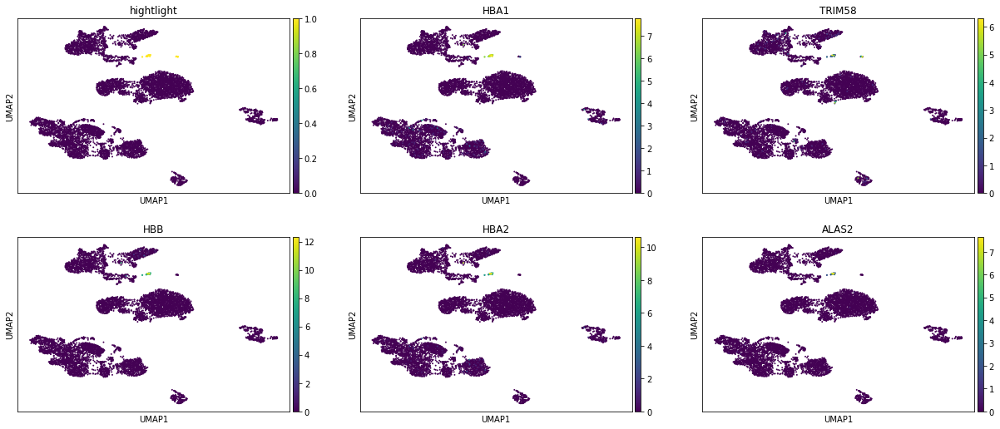

32


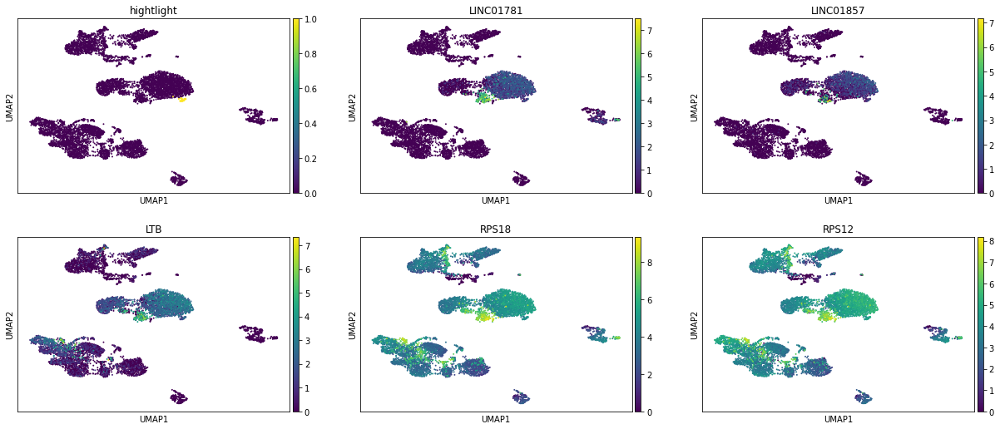

33


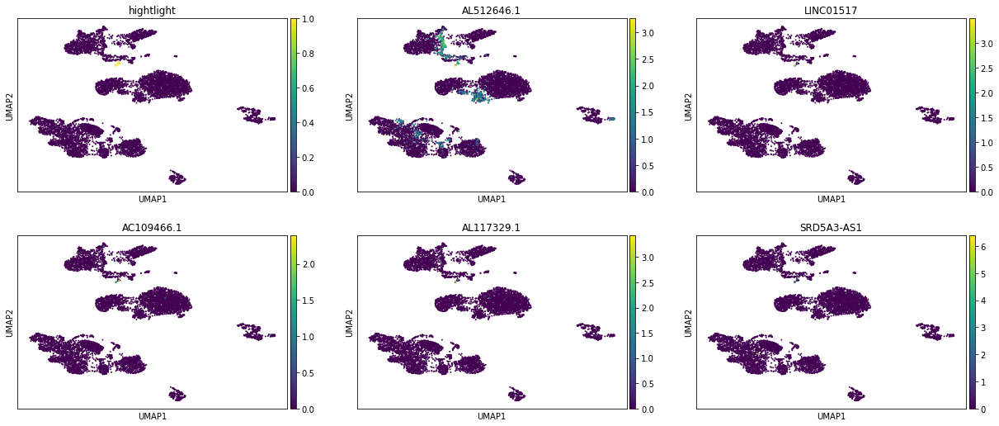

In [28]:
for x in DE.keys():
    print(x)
    topgenes = list(DE[x].T[:5].index)
    organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == x
    sc.pl.umap(
        organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

### The extended DE list can be queried by 

In [29]:
DE["0"].T

,wilcoxon_score,log fold change,adjusted pvalue
S100A9,39.924568,6.841537,0.000000e+00
VCAN,39.776543,6.670365,0.000000e+00
S100A8,39.740734,6.507125,0.000000e+00
LYZ,39.297451,6.777475,0.000000e+00
FCN1,39.221622,6.197366,0.000000e+00
...,...,...,...
TXNIP,-27.812576,-3.107998,1.681551e-167
TSC22D3,-28.343998,-2.925347,6.023306e-174
CD69,-28.850586,-7.179025,3.258692e-180
ZFP36L2,-29.693047,-3.336957,6.862335e-191


# read in cell ontology 

In [30]:
import obonet

ont_dir = "/data/yosef2/users/chenling/TabulaSapiensData/ontology/"
obo = ont_dir + "cl.obo.txt"
f = open(obo, "r")
co = obonet.read_obo(f)
f.close()

celltype_dict = {}
for x in co.nodes:
    celltype_dict[co.nodes[x]['name']] = x



You can look up all T cell by typing celltype_dict['T'] and using tab complete  

In [31]:
celltype_dict["T cell"]

'CL:0000084'

You can also look at the names of all subsets of T cell that contains 'CD4' in their names

In [32]:
import networkx as nx


def PrintChildren(co, parent, pattern=""):
    all_children = [x for x in nx.ancestors(co, celltype_dict[parent])]
    return [co.nodes[x]["name"] for x in all_children if pattern in co.nodes[x]["name"]]


PrintChildren(co, "T cell", "CD4")

['central memory CD4-positive, alpha-beta T cell',
 'CD4-positive, CXCR3-negative, CCR6-negative, alpha-beta T cell',
 'CD4-positive type I NK T cell secreting interleukin-4',
 'activated CD4-positive, CD25-positive, CCR4-positive, alpha-beta regulatory T cell, human',
 'effector memory CD4-positive, alpha-beta T cell',
 'CD4-positive type I NK T cell secreting interferon-gamma',
 'activated CD4-positive, alpha-beta T cell, human',
 'activated CD4-negative, CD8-negative type I NK T cell',
 'CD4-negative, CD8-negative type I NK T cell',
 'effector CD4-positive, alpha-beta T cell',
 'CD4-intermediate, CD8-positive double-positive thymocyte',
 'CD4-positive, alpha-beta cytotoxic T cell',
 'CD24-positive, CD4 single-positive thymocyte',
 'mature CD4 single-positive thymocyte',
 'CD2-positive, CD5-positive, CD44-positive alpha-beta intraepithelial T cell',
 'CD4-positive, CD25-positive, CCR4-positive, alpha-beta regulatory T cell',
 'CD4-negative, CD8-negative type I NK T cell secreting int

# manually create mapping between cluster and cell type (this is just an example), and the relevant marker genes that was used to generate this prediction

In [33]:
organ_adata.obs["annotation_oct2020"] = organ_adata.obs["leiden"].copy()
cluster_mapping = {"0": "T cell"}
cluster_markers = {"0": ["CXCR4", "CD3D", "IL7R", "IL32"]}

This cell will automatically replace the leiden cluster names with cell type annotations

In [34]:
for l in cluster_mapping.keys():
    organ_adata.obs["annotation_oct2020"].replace(l, cluster_mapping[l], inplace=True)
    display(DE[l][cluster_markers[l]])

,CXCR4,CD3D,IL7R,IL32
wilcoxon_score,-3.446386e+01,-1.117157e+01,-8.977628e+00,-1.573861e+01
log fold change,-4.459876e+00,-6.626138e+00,-6.987865e+00,-3.033651e+01
adjusted pvalue,6.322492e-257,3.606732e-27,1.305084e-17,9.819784e-54


# Visualize the results of the manual annotation

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



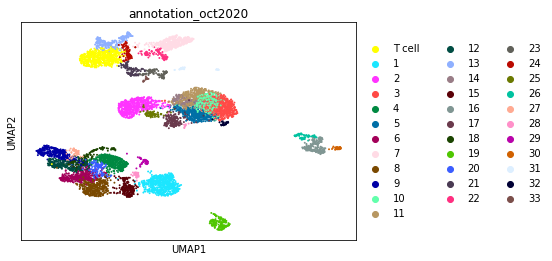

In [35]:
sc.pl.umap(
    organ_adata,
    color=["annotation_oct2020"],
    ncols=3,
)

# create celltype subcluster
This is just an example once the celltype annotations are done, how to subcluster cells in a celltype

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



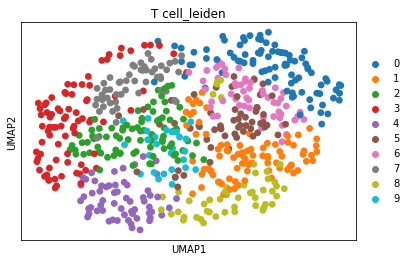

In [36]:
celltype = "T cell"
sub_organ_adata = organ_adata[organ_adata.obs["annotation_oct2020"] == celltype]
sc.pp.neighbors(sub_organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(
    sub_organ_adata,
)
sc.tl.leiden(sub_organ_adata, resolution=1, key_added="%s_leiden" % celltype)
sc.pl.umap(
    sub_organ_adata,
    color=["%s_leiden" % celltype],
    ncols=3,
)

In [37]:
sc.tl.rank_genes_groups(
    sub_organ_adata, groupby="%s_leiden" % celltype, method="wilcoxon"
)
sub_DE = FormatDE(sub_organ_adata.uns["rank_genes_groups"])

0


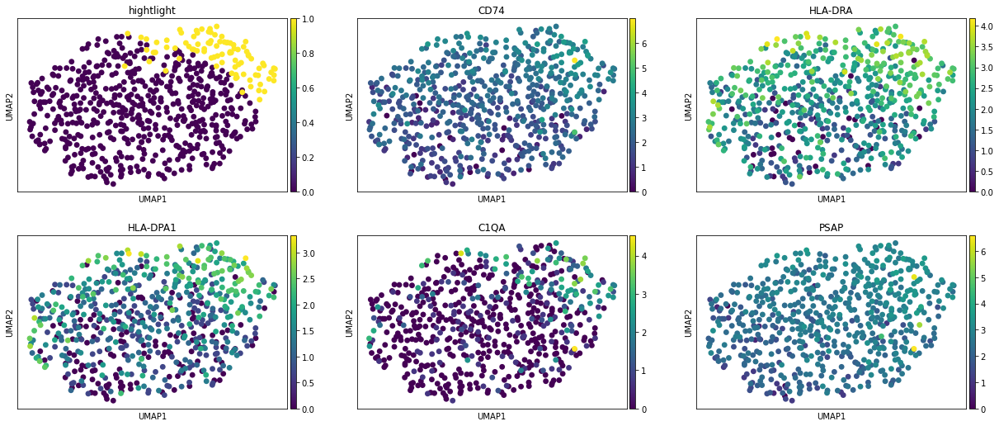

1


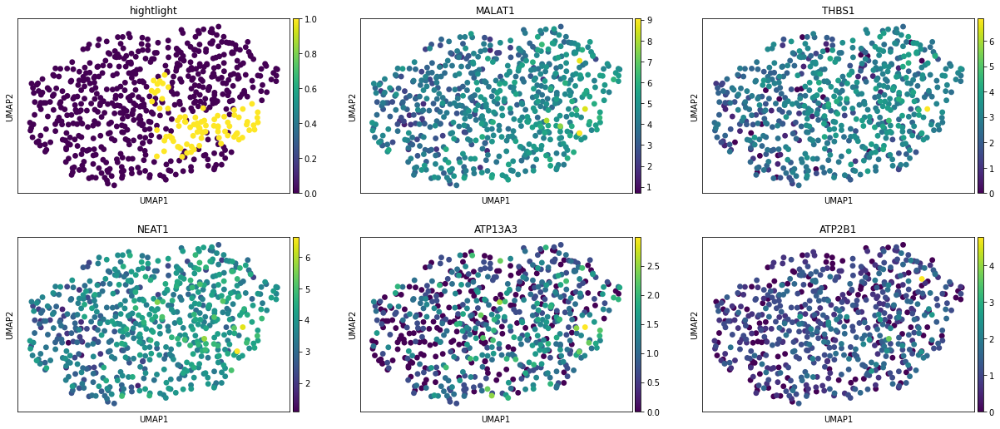

2


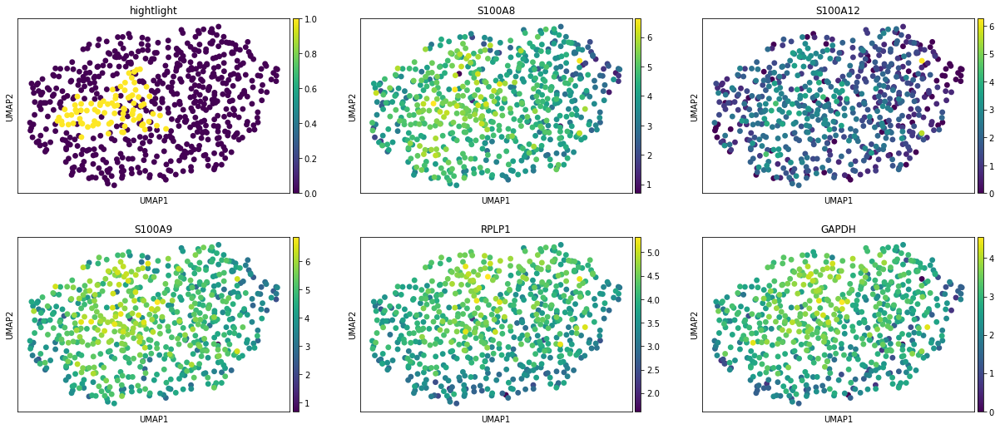

3


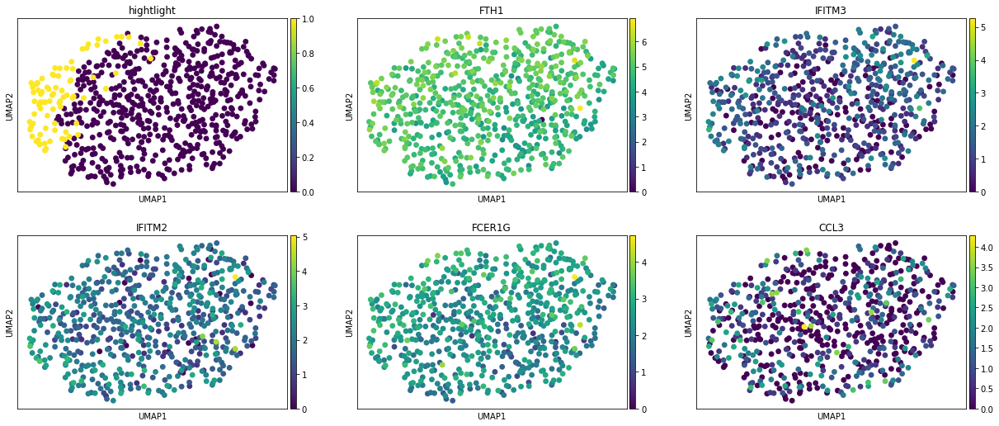

4


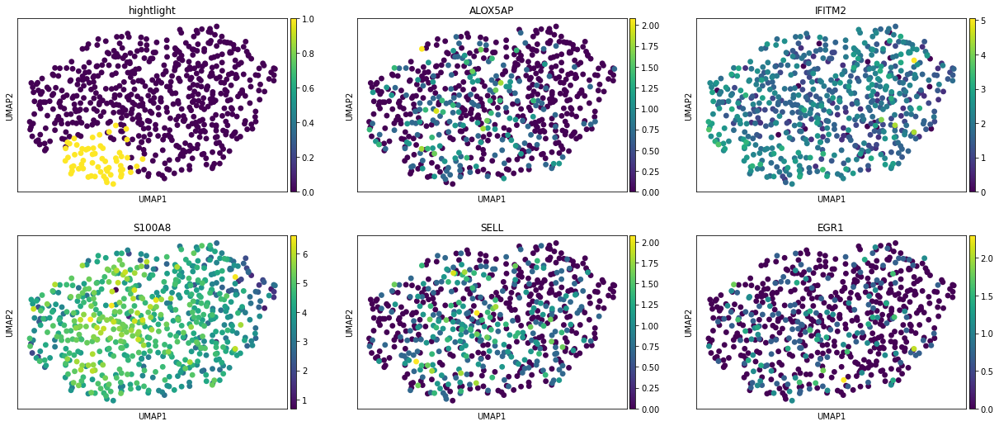

5


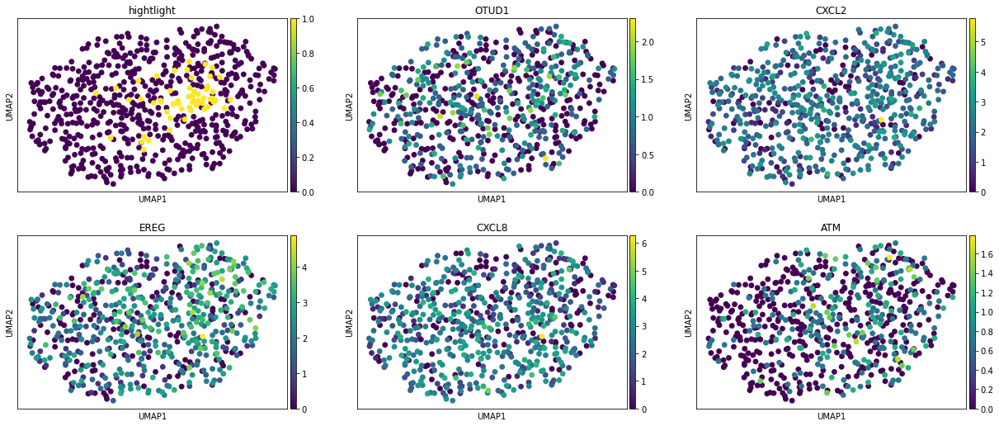

6


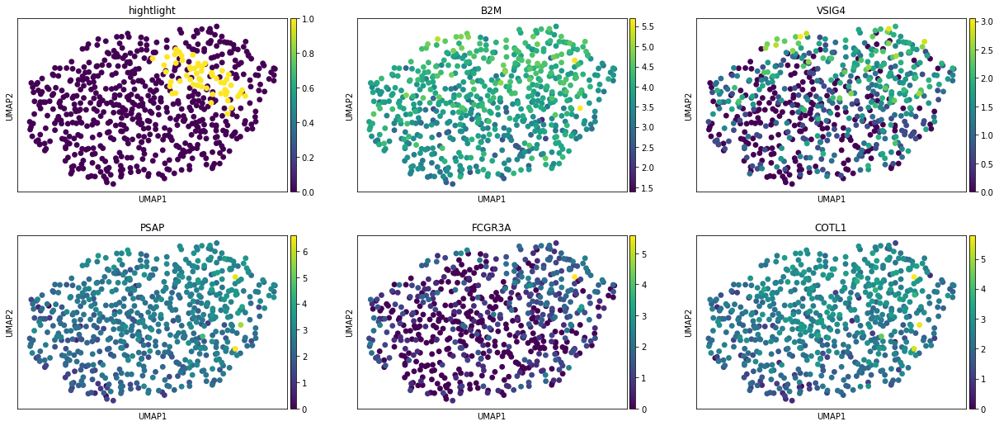

7


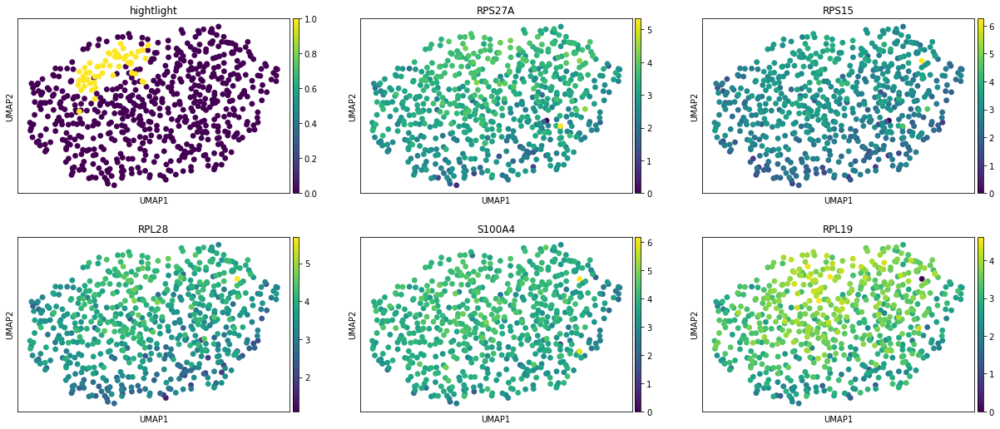

8


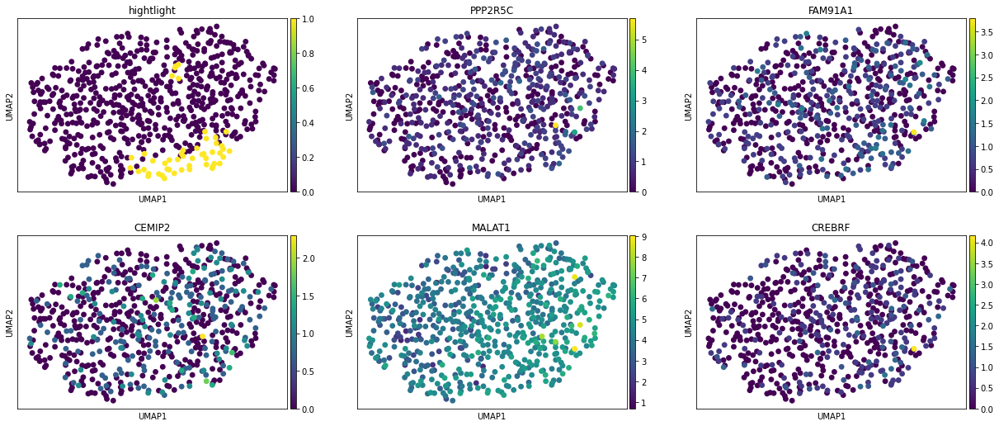

9


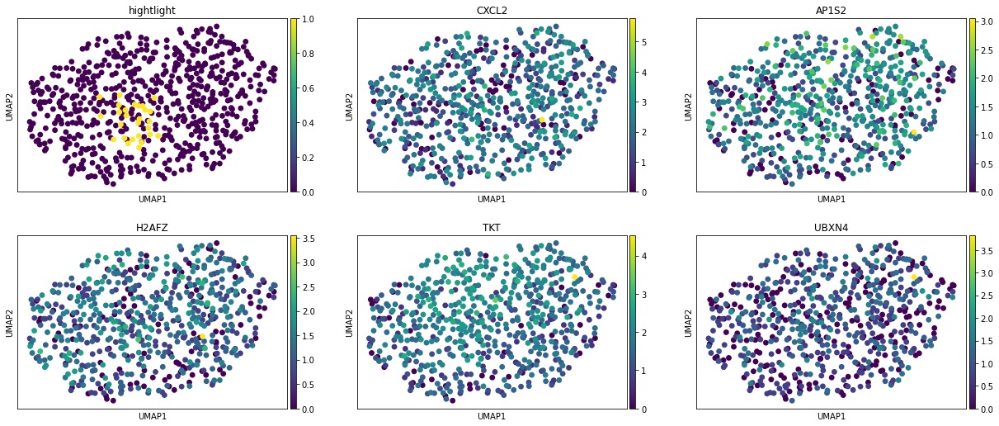

In [38]:
for x in sub_DE.keys():
    print(x)
    topgenes = list(sub_DE[x].T[:5].index)
    sub_organ_adata.obs["hightlight"] = sub_organ_adata.obs["%s_leiden" % celltype] == x
    sc.pl.umap(
        sub_organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

# manually create mapping between cell type and compartment (this is just an example)

In [39]:
organ_adata.obs["compartment_oct2020"] = organ_adata.obs["annotation_oct2020"].copy()
compartment_mapping = {"T cell": "Immune"}

This cell will automatically replace the leiden cluster names with cell type annotations

In [40]:
for c in compartment_mapping.keys():
    organ_adata.obs["compartment_oct2020"].replace(
        c, compartment_mapping[c], inplace=True
    )

# Visualize the results of the new compartment splitting

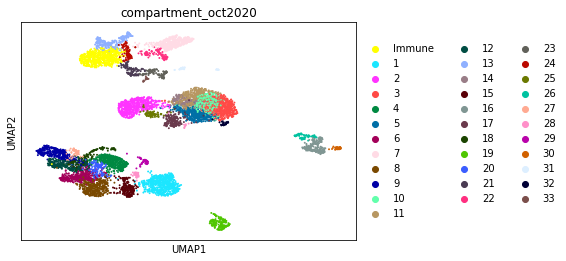

In [41]:
sc.pl.umap(
    organ_adata,
    color=["compartment_oct2020"],
    ncols=3,
)

# save data

In [42]:
organ_adata.write_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.h5ad" % organ
)